# Text Mining project
Diego Biagini  

The main objective of this project is to try explore the various ways of performing Knowledge Graph Embeddings using triplets.  
We will first look at some methods which are already implemented in PyKeen, a really well made and easy to use library.  
Then we will also try to augment the representation of entities by providing our embedder model a description of those entities, extracted from Wikipedia.

BEFORE RUNNING THIS NOTEBOOK:  
To make sure that everything works fine, run the first two cells of the notebook, then restart the runtime and rerun everything.  

RUNNING THE NOTEBOOK WITHOUT TRAINING:  
Various cells take a lot of time to run (from 30 minutes to a few hours), these are the procedure to download entity descriptions from Wikimedia's API and the various model training cells.  
In the beginning of the notebook (3rd cell) the results of these operations (entity descriptions and trained models) can be downloaded for reproducibility purposes without having to repeat them.



In [ ]:
!pip install Cython 
!pip install sentencepiece # For bigbird
!pip install pykeen --use-deprecated=backtrack-on-build-failures
!pip install transformers
!pip install datasets


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 16.7 MB/s eta 0:00:00
DEPRECATION: Backtracking on build failures can mask issues related to how a package generates metadata or builds a wheel. This flag will be removed in pip 22.2. A possible replacement is avoiding known-bad versions by explicitly telling pip to ignore them (either directly as requirements, or via a constraints file). Discussion can be found at https://github.com/pypa/pip/issues/10655
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 717.7/717.7 KB 12.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build w

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()
!pip install ipympl
%matplotlib widget


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
"""
# Copy the Entity/Relation names and text to local storage from drive
from google.colab import drive
drive.mount('/gdrive')

!cp -av '/gdrive/My Drive/Datasets/Wikidata/.' '/content'
"""



--2023-01-31 15:47:18--  https://docs.google.com/uc?export=download&confirm=t&id=1UudwN24ISWr0kqezdkYAlXxH_z-dNHYm
Resolving docs.google.com (docs.google.com)... 142.251.161.139, 142.251.161.138, 142.251.161.101, ...
Connecting to docs.google.com (docs.google.com)|142.251.161.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0s-70-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/v1f5lrk6qgoink7gjrqb0tj9q8e06027/1675179975000/02051523167862294633/*/1UudwN24ISWr0kqezdkYAlXxH_z-dNHYm?e=download&uuid=5946ebf1-40c9-4870-8ecb-211c044f1537 [following]
--2023-01-31 15:47:18--  https://doc-0s-70-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/v1f5lrk6qgoink7gjrqb0tj9q8e06027/1675179975000/02051523167862294633/*/1UudwN24ISWr0kqezdkYAlXxH_z-dNHYm?e=download&uuid=5946ebf1-40c9-4870-8ecb-211c044f1537
Resolving doc-0s-70-docs.googleusercontent.com (doc-0s-70-docs.googleusercontent.com)... 173.194.197.

In [ ]:
import pykeen
from pykeen import datasets, pipeline
import torch
import gc
import requests
import json
import numpy as np
import pandas as pd
import random
from datasets import load_dataset, Dataset

from sklearn.cluster import *
from sklearn.metrics import *
from sklearn.linear_model import *
from sklearn.preprocessing import *
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt


import re
import bs4
import pickle
import os, psutil

import matplotlib.pyplot as plt
from matplotlib.widgets import Button
from matplotlib.text import Annotation
from sklearn.cluster import DBSCAN, OPTICS, AgglomerativeClustering
from sklearn.metrics import silhouette_score

import seaborn as sns

from torch import nn
from transformers import AutoModelForMaskedLM



# The dataset
The base dataset that we will use is "Wikidata50K"(WD50K), as described in <a href="https://aclanthology.org/2020.emnlp-main.596.pdf">
Galkin, M., et al. (2020). Message Passing for Hyper-Relational Knowledge Graphs.  </a>.  
This is a subset of the entire WikiData dataset, made up of triples which represent more concrete relationships than those usually found on WikiData, furthermore connectivity is improved by removing entities mentioned less than 2 times.  
This results in a datasets that is mostly focused on actors, movies, TV shows, etc.

In its entirety WD50K contains 236,507 statements (split into train, validation and testing)
describing 47,156 entities with 532 relations.

Despite this dataset being not that big compared to WikiData, it will too big for our latter methods on Colab, thus we extracted only 15K samples from it.

In [ ]:
# Even if this dataset is not that big it's too big for the latter methods and colab's resources, 
#so I will take a subset as the first 15 K triples of the training set (around 10% of the training set)
wd_50_og = datasets.get_dataset(dataset="WD50KT")
subset_triples = wd_50_og.training.triples[:15000,:]

# Get the entity and relation list
# Using a set, the forgotten python collection
entities = set()
relations = set()
# And rebuild the mapping from labels to ids
entity_to_id = {}
relation_to_id = {}

for trip in subset_triples:
  entities.add(trip[0].item())
  if not trip[0].item() in entity_to_id:
    entity_to_id[trip[0].item()] = len(entity_to_id)

  relations.add(trip[1].item())
  if not trip[1].item() in relation_to_id:
    relation_to_id[trip[1].item()] = len(relation_to_id)

  entities.add(trip[2].item())
  if not trip[2].item() in entity_to_id:
    entity_to_id[trip[2].item()] = len(entity_to_id)

mapped_subset_triples = np.zeros_like(subset_triples, dtype=int)
for i in range(mapped_subset_triples.shape[0]):
  mapped_subset_triples[i, 0] = entity_to_id[subset_triples[i,0]]
  mapped_subset_triples[i, 1] = relation_to_id[subset_triples[i,1]]
  mapped_subset_triples[i, 2] = entity_to_id[subset_triples[i,2]]

wd_50s = pykeen.triples.TriplesFactory(mapped_subset_triples, entity_to_id, relation_to_id)
wd_50_train, wd_50_val, wd_50_test = wd_50s.split([0.8,0.1,0.1])

INFO:pykeen.datasets.utils:Caching preprocessed dataset to file:///root/.data/pykeen/datasets/wd50kt/cache/47DEQpj8HBSa-_TImW-5JCeuQeRkm5NM
INFO:pykeen.triples.triples_factory:Stored TriplesFactory(num_entities=40107, num_relations=473, create_inverse_triples=False, num_triples=164631, path="/root/.data/pykeen/datasets/wd50kt/train.txt") to file:///root/.data/pykeen/datasets/wd50kt/cache/47DEQpj8HBSa-_TImW-5JCeuQeRkm5NM/training
INFO:pykeen.datasets.base:Stored training factory to file:///root/.data/pykeen/datasets/wd50kt/cache/47DEQpj8HBSa-_TImW-5JCeuQeRkm5NM/training
INFO:pykeen.triples.triples_factory:Stored TriplesFactory(num_entities=40107, num_relations=473, create_inverse_triples=False, num_triples=45284, path="/root/.data/pykeen/datasets/wd50kt/test.txt") to file:///root/.data/pykeen/datasets/wd50kt/cache/47DEQpj8HBSa-_TImW-5JCeuQeRkm5NM/testing
INFO:pykeen.datasets.base:Stored testing factory to file:///root/.data/pykeen/datasets/wd50kt/cache/47DEQpj8HBSa-_TImW-5JCeuQeRkm5NM/t

## Extracting entity descriptions
We want to augment our KG embeddings with entity descriptions.  
To do so we can use WikiMedia's API.  
For each triple we have identifiers in the form of "QX+", from this we have to first obtain a page name and then a page description.  
To obtain a description here we use the "extracts" API, which provides us with a text-only representation of the page. This is cleaner than the alternative (the "query" API) but it leaves out a lot of data that is usually found in tables and lists.

In [ ]:
# Obtain the real entity names
q_to_entity = {}
entity_to_text = {}
i = 0

for entity in entities:
  i += 1
  if i % 1000 == 0:
    print(i)

  url = f'https://www.wikidata.org/wiki/Special:EntityData/{entity}.json'

  response = requests.get(url)

  try:
      data = json.loads(response.text)
      entity_id = list(data["entities"].keys())[0]
      entity_data = data["entities"][entity_id]

      # Check if it has an english entry, if there isn't just choose the name
      # in a random language (while having a preference for less exotic languages)
      if "en" in entity_data["labels"]:
        entity_name = entity_data["labels"]["en"]["value"]
      else:
        preferred_languages = ["es", "it", "fr", "de"]

        not_en_entity_name = None
        for l in preferred_languages:
          if l in entity_data["labels"]:
            not_en_entity_name = entity_data["labels"][l]["value"]
            break
        if not_en_entity_name is None:
          not_en_entity_name = entity_data["labels"][list(entity_data["labels"].keys())[0]]["value"]

        q_to_entity[entity] = not_en_entity_name
        entity_to_text[not_en_entity_name] = not_en_entity_name
        continue

      q_to_entity[entity] = entity_name

      # Get wikipedia entry
      # Set the API endpoint URL
      API_ENDPOINT = "https://en.wikipedia.org/w/api.php"

      """
      # TO OBTAIN THE ENTIRE CONTENT OF THE PAGE
      # The extracted content is much messier however

      # Set the parameters for the API request
      params = {
          "action": "parse",
          "format": "json",
          "page": entity_name,
          "prop": "text",
          "formatversion":2,
      }

      # Send the API request and get the response
      response2 = requests.get(API_ENDPOINT, params=params)

      try:
        # Get the page content from the response
        response_json = response2.json()
        content = response_json["parse"]["text"]
        plain_text = bs4.BeautifulSoup(content).get_text()
        plain_text = re.sub("\.mw-parser-output.*", "", plain_text)
        plain_text = re.sub("\n+", "\n", plain_text)

        entity_to_text[entity_name] = plain_text
      """
      # TO OBTAIN JUST A SUMMARY
      # Set the parameters for the API request
      params = {
          "action": "query",
          "format": "json",
          "titles": entity_name,
          "exlimit":1,
          "prop": "extracts",
          "formatversion":2,
          "explaintext":1
      }

      # Send the API request and get the response
      response2 = requests.get(API_ENDPOINT, params=params)

      try:
        # Get the page content from the response
        response_json = response2.json()
        entity_to_text[entity_name] = response_json['query']['pages'][0]["title"] + " \n " + re.sub("\n+", "\n", response_json['query']['pages'][0]["extract"])
      except Exception as e: 
        # In case the wikipedia page does not exist add the description as text
        if "descriptions" in entity_data:
          if "en" in entity_data["descriptions"]:
            entity_to_text[entity_name] = entity_name + " \n " + entity_data["descriptions"]["en"]["value"]
          else:
            entity_to_text[entity_name] = entity_name
        else:
          print("Failed to retrieve data for ", entity_name)
          entity_to_text[entity_name] = entity_name
          print(e)
  except Exception as e:
      print('Failed to retrieve data for ', url)
      q_to_entity[entity] = entity
      entity_to_text[entity] = entity
      print(e)

print(q_to_entity)

with open('q_to_entity.pickle', 'wb') as f:
    pickle.dump(q_to_entity, f)
with open('entity_to_text.pickle', 'wb') as f:
    pickle.dump(entity_to_text, f)

# Also write a txt with a description on each row
with open("entity_texts.txt", "wt") as f:
  for r in entity_to_text:
    f.write(entity_to_text[r].replace("\n"," ") + "\n")

Once we have extracted those informations we can define the following mappings:
- id_to_label: from pykeen's internal representation to a "QX+" value
- label_to_id: inverse of ^
- label_to_name: from a "QX+" value to a human readable value, i.e. the page title
- id_to_name: from pykeen's internal representation to the page title

It turns out that multiple "QX+" labels for entities can be mapped to the same page and thus have the same title, for this reason we can't invert some of these mappings

In [ ]:
with open("q_to_entity.pickle", "rb") as f:
  q_to_entity = pickle.load(f)
with open("entity_to_text.pickle", "rb") as f:
  entity_to_text = pickle.load(f)

# Define the mapping between name, label and id
# Name is the real human readable name
# Label is the encoding used by wikidata i.e. PX, QY
# Id is the id used by pykeen
id_label_entmap = wd_50s.entity_id_to_label
label_id_entmap = pykeen.utils.invert_mapping(id_label_entmap)

label_name_entmap = q_to_entity.copy()
#name_label_entmap = pykeen.utils.invert_mapping(label_name_entmap)

#name_id_entmap = {name:label_id_entmap[name_label_entmap[name]] for name in name_label_entmap}
id_name_entmap = {id:label_name_entmap[id_label_entmap[id]] for id in id_label_entmap}


We can do the same for relationships, in particular to extract their actual name.  
However most relationships do not have a corresponding Wikipedia page and thus have at most a really brief description provided by WikiMedia.

In [ ]:
# Obtain the real relation names
p_to_relation = {}
relation_to_text = {}
i = 0

for relation in relations:
  i += 1
  if i % 1000 == 0:
    print(i)

  url = f'https://www.wikidata.org/wiki/Special:EntityData/{relation}.json'

  response = requests.get(url)

  try:
      data = json.loads(response.text)
      relation_id = list(data["entities"].keys())[0]
      relation_data = data["entities"][relation_id]

      # Check if it has an english entry, if there isn't just choose the name
      # in a random language (while having a preference for less exotic languages)
      if "en" in entity_data["labels"]:
        relation_name = relation_data["labels"]["en"]["value"]
      else:
        preferred_languages = ["es", "it", "fr", "de"]

        not_en_relation_name = None
        for l in preferred_languages:
          if l in relation_data["labels"]:
            not_en_relation_name = relation_data["labels"][l]["value"]
            break
        if not_en_relation_name is None:
          not_en_relation_name = relation_data["labels"][list(relation_data["labels"].keys())[0]]["value"]

        p_to_relation[relation] = not_en_relation_name
        relation_to_text[not_en_relation_name] = not_en_relation_name
        continue

      p_to_relation[relation] = relation_name

      # Relations usually do not have a wikipedia page, just take their description
      if "descriptions" in relation_data:
        if "en" in relation_data["descriptions"]:
          relation_to_text[relation_name] = relation_name + " \n " + relation_data["descriptions"]["en"]["value"]
        else:
          relation_to_text[relation_name] = relation_name
      else:
        print("Failed to retrieve data for ", relation_name)
        relation_to_text[relation_name] = relation_name
        print(e)

  except Exception as e:
      print('Failed to retrieve data for ', url)
      p_to_relation[relation] = relation
      relation_to_text[relation] = relation
      print(e)

with open('p_to_relation.pickle', 'wb') as f:
    pickle.dump(p_to_relation, f)
with open('relation_to_text.pickle', 'wb') as f:
    pickle.dump(relation_to_text, f)

# Also write a txt with a description on each row
with open("relation_texts.txt", "wt") as f:
  for r in relation_to_text:
    f.write(relation_to_text[r].replace("\n"," ") + "\n")

And create similar mappings to those for entities:

In [ ]:
with open("p_to_relation.pickle", "rb") as f:
  p_to_relation = pickle.load(f)
with open("relation_to_text.pickle", "rb") as f:
  relation_to_text = pickle.load(f)

# Define the mapping between name, label and id
# Name is the real human readable name
# Label is the encoding used by wikidata i.e. PX, QY
# Id is the id used by pykeen
id_label_relmap = wd_50s.relation_id_to_label
label_id_relmap = pykeen.utils.invert_mapping(id_label_relmap)

label_name_relmap = p_to_relation.copy()
name_label_relmap = pykeen.utils.invert_mapping(label_name_relmap)

name_id_relmap = {name:label_id_relmap[name_label_relmap[name]] for name in name_label_relmap}
id_name_relmap = pykeen.utils.invert_mapping(name_id_relmap)

print(name_id_relmap)

{'ICAA rating': 124, 'influenced by': 33, 'writing language': 31, 'website account on': 212, 'genetic association': 220, 'occupation': 19, 'different from': 67, 'gens': 174, 'takes place in fictional universe': 92, 'occupant': 179, 'family name': 133, 'used by': 216, 'sport': 80, 'MPA film rating': 93, 'Filmiroda rating': 94, 'head coach': 90, 'significant event': 97, 'voice actor': 121, 'place of burial': 123, 'partially coincident with': 182, 'field of work': 142, 'official color': 91, 'producer': 117, 'military rank': 240, 'narrative location': 44, 'spouse': 104, 'cause of death': 48, 'diplomatic relation': 15, "topic's main category": 139, 'set in period': 39, 'league': 115, 'head of state': 242, 'Roman nomen gentilicium': 173, 'NATO code for grade': 167, 'platform': 226, 'residence': 30, 'edition or translation of': 227, 'executive body': 241, 'CNC film rating (Romania)': 95, 'opposite of': 146, 'political ideology': 100, 'has subsidiary': 170, 'narrator': 187, 'aspect ratio (W:H)

### Data exploration

Let's analyze some properties of the triplets, for example which heads, tails and relations are most prevalent.

In [ ]:
print(f"Number of Entities: {wd_50_train.num_entities}")
print(f"Number of Relations: {wd_50_train.num_relations}")

print(f"Number of Triples:\n Train: {wd_50_train.num_triples}\n Validation:{wd_50_val.num_triples} \n Test:{wd_50_test.num_triples}")

print("-"*5)

n_top = 10
print("Most common relations:")
for r in wd_50_train.get_most_frequent_relations(n_top):
  print(id_name_relmap[r])
print("-"*5)
print("Most common entities:")
entity_count = {i:0 for i in range(wd_50_train.num_entities)}
for triple in wd_50_train.mapped_triples:
  entity_count[triple[0].item()] += 1 
  entity_count[triple[2].item()] += 1

top_entities = sorted(list(entity_count.items()), key = lambda x: x[1], reverse=True)[:n_top]
for e in top_entities:
  print(id_name_entmap[e[0]])

INFO:pykeen.triples.triples_factory:applying cutoff of 10 to TriplesFactory(num_entities=7847, num_relations=249, create_inverse_triples=False, num_triples=12000)


Number of Entities: 7847
Number of Relations: 249
Number of Triples:
 Train: 12000
 Validation:1500 
 Test:1500
-----
Most common relations:
genre
cast member
instance of
shares border with
language used
member of
winner
occupation
nominated for
award received
-----
Most common entities:
CSI: Crime Scene Investigation
Beverly Hills, 90210
United States of America
Another World
English
Breaking Bad
Lost in Translation
Assam
Alzheimer's disease
Cameroon


In [ ]:
# Example of a triple
idx = 5
print(f"{label_name_entmap[wd_50_train.triples[idx][0]]}, {label_name_relmap[wd_50_train.triples[idx][1]]}, {label_name_entmap[wd_50_train.triples[idx][2]]}")

Boston, twinned administrative body, Barcelona


# Using PyKeen Models

We are going to train and evaluate 5 types of models.  
Pykeen makes this seamless, however they are quite different in principle so here is the main ideas behind them:


### TransE
Paper: [Translating Embeddings for Modeling
Multi-relational Data](https://proceedings.neurips.cc/paper/2013/file/1cecc7a77928ca8133fa24680a88d2f9-Paper.pdf)

TransE is a simple neural embedding model for knowledge representation in which entities and relationships are embedded in a continuous vector space. 
The underlying assumption of TransE is that if a relationship holds between two entities, the vector representation of the relationship should be close to the vector representations of the entities.  
TransE uses distance metrics, such as the L1 or L2 distance, to measure the closeness between vectors. During training, the model is presented with a set of triplets of the form (h, r, t) and learns embeddings that minimize the  following constraint equation:
$$ \gamma - d_r(h,t) = \gamma - ||h+r-t||_2$$ 
Here $\gamma$ is an hyperparameter and is called the margin.  
Negative terms, obtained by sampling fake head/tail entities, are often added to this loss, to also force non-existent connections to be far apart.  
The model has been successful in benchmark datasets, but has limitations when dealing with 1-to-N and N-to-1 relationships and inverse relationships.

To solve these problems many variants have been proposed like:
- TransH, which tries to solve the 1-N,N-1 relationships problem by modeling the relation embedding as an hyperplane, on which entities are first projected before comparing them
- TransR, which in addition to what TransH does it also considers relations as belonging to a different vector space than that of entities 

### DistMult
Paper: [Embedding Entities and Relations for Learning and Inference in Knowledge Bases
](https://arxiv.org/abs/1412.6575)

The DistMult model is a so-called bilinear model for knowledge embedding that encodes entities as vectors in a high dimensional space and relations as matrices.  
In such a framework the basic score function of a triple $(h,r,t)$ is defined as:
$$ f(h,r,t) = \textbf{e}_h^{T} \textbf{W}_{r} \textbf{e}_t = \sum_{i=1}^{d}\sum_{j=1}^{d} w_{ij}^{(r)}
(\textbf{e}_h)_{i} (\textbf{e}_t)_{j}$$ 
Where $e_h$ and $e_t$ are the entity embeddings and $W_r$ is the relation embedding.
In a way that can be seen as regularization, in DistMult we force the matrix $W_r$ to be a diagonal matrix.  

The neural network parameters of the model can be learned by minimizing
a margin-based ranking objective between positive and negative samples, this is akin to a contrastive training regime:
$$L = \sum_{(e_1,r,e_2)\in T}\sum_{(e'_1,r,e'_2)\in T'} max(S_{(e'_1,r,e'_2)}-S_{(e_1,r,e_2)} +1,0)$$
Where $T$ contains the true triplets and $T'$ contains negative samples.


A nice property of the DistMult formulation is the fact that $f(h,r,t)=f(t,r,h)$, thus it works well when we know that relationships are symmetric.

### ConvE
Paper: [Convolutional 2D Knowledge Graph Embeddings](https://arxiv.org/abs/1707.01476)

ConvE is a model for knowledge embedding that uses convolutional neural networks (CNNs) to embed knowledge from a knowledge graph into a continuous vector space. The idea behind the model is that by using a deeper convolutional network compared to the shallower networks used in models like TransE, we are able to obtain more semantically rich representations for our entities.

The main innovation that was introduced by ConvE is the idea of defining the score function as the output of a model which works on embeddings as if they were images, in the following way:
- Obtain the entity and relation embeddings from the embedding matrix
- Concatenate them in a way to obtain a 2D representation
- Pass this "image" into a fully convolutional network, to obtain another 2D structure as output
- Reshape the output into a vector, project it into a lower dimensional space and compute the correlation with the entity matrix

In the end ConvE was found to be parameter-efficient and robust to overfitting, with an exceptionally noticeable ability to model relationship with an high indegree. The main drawback of ConvE however seems to be its higher computational footprint. 

### QuatE
Paper: [Quaternion Knowledge Graph Embeddings
](https://proceedings.neurips.cc/paper/2019/file/d961e9f236177d65d21100592edb0769-Paper.pdf)

QuatE is a continuation of another family of models, the ComplexE family, which work by representing embeddings in the space of complex numbers instead of real numbers.  
QuatE goes one step further and tries to learn embeddings in the hyper-complex space, where an embedding is a quaternion (a vector in the hyper-complex space),that is a set of three imaginary components and a real component.  

If we set the embedding dimension as $k$, the embedding of an entity $h$ is defined as follows:
$$ Q_h = \{a_h + b_h i + c_h j + d_h k \quad |\quad a_h,b_h,c_h,d_h \in \mathcal{R}^k\}$$
Likewise a relation $r$ is embedded as: 
$$ W_r = \{a_r + b_r i + c_r j + d_r k \quad |\quad a_r,b_r,c_r,d_r \in \mathcal{R}^k\}$$
If we define $W_r^◃$ as the normalization of $W_r$, we can define the rotation of an entity embedding $Q_h$ by the relation as the Hamilton product in the space of quaternions:
$$Q'_t = Q_t ⊗ W_r^◃$$

And finally the score function is defined as the quaternion inner product, that  is:
$$ \phi(h,r,t)= Q_h' \cdot  Q_t = \langle a_h', a_t \rangle + \langle b_h', b_t \rangle + \langle c_h', c_t \rangle + \langle d_h', d_t \rangle$$

It turns out that such a representation and scoring function is very robust to patterns like symmetry, antisimmetry and inversion, as well as being very parameter efficient.  
Furthermore it does not fix compositional patterns but it lets the model learn them.

### BoxE
Paper: [BoxE: A Box Embedding Model for
Knowledge Base Completion](https://proceedings.neurips.cc/paper/2020/file/6dbbe6abe5f14af882ff977fc3f35501-Paper.pdf)

BoxE is based around the idea of encoding relations as
axis-aligned hyper-rectangles (or boxes) and entities as points in the d-dimensional Euclidian space.

Every entity $e$ is represented by two vectors $e_i, b_i ∈ \mathcal{R}^d$, where $e_i$
defines the base position of the entity, and $b_i$ defines its translational bump.

Every relation $r$ is represented by $n$ hyper-rectangles, i.e. boxes, lying in  the space $\mathcal{R}^d$
where $n$ is the arity of $r$.

The final embedding of an entity $e_i$ relative to a fact $r(e_1, . . . , e_n)$ is given by:
$$e_i^{r(e_1,\dots, e_n)} = (e_i-b_i)+\sum_{1 \leq j \leq n}b_j$$

With this formulation we obtain an entity representation which is dynamic, as every entity can have a potentially different final
embedding relative to a different fact. 

The scoring function is defined as:
$$\phi(r(e_1,\dots, e_n))=\sum_{i=1}^n || dist(e_i^{r(e_1,\dots, e_n)}, r^{(i)})||_x$$
This corresponds to the sum of the L-x norms of distances across all n entities and relation boxes.  
The distance follows a particular formulation that factors in the size of the target box in its
computation, by inversely correlating it with box size.

It is possible to prove that BoxE is a fully expressive model of any KG with dimensionality linear in the number of entities.  
Furthermore it can express pretty much any inference pattern other than compositionality.

### Training

In [ ]:
models = ["TransE", "DistMult", "ConvE", "QuatE", "BoxE"]

results = {k:None for k in models}

for model in models:
  result = pipeline.pipeline(
      training=wd_50_train,
      validation=wd_50_val,
      testing=wd_50_test,
      model=model,
      stopper='early',
      epochs=100
  )

  # Save the results and the trained model
  result.save_to_directory(model)
  results[model] = result
  gc.collect()
  torch.cuda.empty_cache()

INFO:pykeen.pipeline.api:Using device: None
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt


Training epochs on cuda:0:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Starting batch_size search for evaluation now...
INFO:pykeen.evaluation.evaluator:Concluded batch_size search with batch_size=2048.
INFO:pykeen.evaluation.evaluator:Evaluation took 0.24s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.014. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.28s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.027. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.18s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 30: 0.043666666666666666. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 30.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.18s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 40: 0.06. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 40.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.20s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 50: 0.07733333333333334. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 50.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.19s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 60: 0.09566666666666666. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 60.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.18s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 70: 0.10766666666666666. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 70.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.18s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 80: 0.12. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 80.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.19s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 90: 0.131. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 90.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.20s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 100: 0.14433333333333334. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-b3b89e0f-915d-4469-bed6-de90e2b26e2d.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 100.


Evaluating on cuda:0:   0%|          | 0.00/1.50k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.19s seconds
INFO:pykeen.triples.triples_factory:Stored TriplesFactory(num_entities=7847, num_relations=249, create_inverse_triples=False, num_triples=12000) to file:///content/TransE/training_triples
INFO:pykeen.pipeline.api:Saved to directory: file:///content/TransE
INFO:pykeen.pipeline.api:Using device: None
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt


Training epochs on cuda:0:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Starting batch_size search for evaluation now...
INFO:pykeen.evaluation.evaluator:Concluded batch_size search with batch_size=2048.
INFO:pykeen.evaluation.evaluator:Evaluation took 0.17s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.0033333333333333335. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.20s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.058. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.19s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 30: 0.13366666666666666. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 30.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.19s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 40: 0.19733333333333333. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 40.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.18s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 50: 0.22833333333333333. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 50.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.20s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 60: 0.24166666666666667. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 60.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.20s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 70: 0.25033333333333335. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 70.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.20s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 80: 0.261. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 80.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.20s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 90: 0.26866666666666666. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 90.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.20s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 100: 0.2946666666666667. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-805e9a3e-50bf-462a-aad0-4e432b1df975.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 100.


Evaluating on cuda:0:   0%|          | 0.00/1.50k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.23s seconds
INFO:pykeen.triples.triples_factory:Stored TriplesFactory(num_entities=7847, num_relations=249, create_inverse_triples=False, num_triples=12000) to file:///content/DistMult/training_triples
INFO:pykeen.pipeline.api:Saved to directory: file:///content/DistMult
INFO:pykeen.pipeline.api:Using device: None
The ConvE model should be trained with inverse triples.
This can be done by defining the TriplesFactory class with the _create_inverse_triples_ parameter set to true.
INFO:pykeen.nn.modules:Resolving None * None * None = 200.
INFO:pykeen.nn.modules:Resolved to 1 * 20 * 10 = 200.
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-53042322-401c-41bc-a326-899fd0b20505.pt


Training epochs on cuda:0:   0%|          | 0/100 [00:00<?, ?epoch/s]

INFO:pykeen.training.training_loop:Dropping last (incomplete) batch each epoch (1/46 (2.17%) batches).


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Starting batch_size search for evaluation now...
INFO:pykeen.evaluation.evaluator:Concluded batch_size search with batch_size=16.
INFO:pykeen.evaluation.evaluator:Evaluation took 54.11s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.048666666666666664. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-53042322-401c-41bc-a326-899fd0b20505.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 54.66s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.10033333333333333. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-53042322-401c-41bc-a326-899fd0b20505.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 54.99s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 30: 0.11833333333333333. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-53042322-401c-41bc-a326-899fd0b20505.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 30.


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 55.08s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 40: 0.13033333333333333. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-53042322-401c-41bc-a326-899fd0b20505.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 40.


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 55.15s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 50: 0.138. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-53042322-401c-41bc-a326-899fd0b20505.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 50.


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 55.30s seconds


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 55.32s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 70: 0.15066666666666667. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-53042322-401c-41bc-a326-899fd0b20505.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 70.


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 55.39s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 80: 0.15366666666666667. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-53042322-401c-41bc-a326-899fd0b20505.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 80.


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 55.38s seconds


Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/46 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 55.38s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 100: 0.16833333333333333. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-53042322-401c-41bc-a326-899fd0b20505.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 100.


Evaluating on cuda:0:   0%|          | 0.00/1.50k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 55.64s seconds
INFO:pykeen.triples.triples_factory:Stored TriplesFactory(num_entities=7847, num_relations=249, create_inverse_triples=False, num_triples=12000) to file:///content/ConvE/training_triples
INFO:pykeen.pipeline.api:Saved to directory: file:///content/ConvE
INFO:pykeen.pipeline.api:Using device: None
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-a46caf31-32a2-4ec2-9245-49bc59931726.pt


Training epochs on cuda:0:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Starting batch_size search for evaluation now...
INFO:pykeen.evaluation.evaluator:Concluded batch_size search with batch_size=256.
INFO:pykeen.evaluation.evaluator:Evaluation took 2.35s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.37266666666666665. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-a46caf31-32a2-4ec2-9245-49bc59931726.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.34s seconds


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.34s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 30. The best result 0.37266666666666665 occurred at epoch 10.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-a46caf31-32a2-4ec2-9245-49bc59931726.pt


Evaluating on cuda:0:   0%|          | 0.00/1.50k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.42s seconds
INFO:pykeen.triples.triples_factory:Stored TriplesFactory(num_entities=7847, num_relations=249, create_inverse_triples=False, num_triples=12000) to file:///content/QuatE/training_triples
INFO:pykeen.pipeline.api:Saved to directory: file:///content/QuatE
INFO:pykeen.pipeline.api:Using device: None
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-95d85645-f937-4086-802d-adadd75de5ab.pt


Training epochs on cuda:0:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Starting batch_size search for evaluation now...
INFO:pykeen.evaluation.evaluator:Concluded batch_size search with batch_size=256.
INFO:pykeen.evaluation.evaluator:Evaluation took 5.27s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.336. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-95d85645-f937-4086-802d-adadd75de5ab.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.17s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.38366666666666666. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-95d85645-f937-4086-802d-adadd75de5ab.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.19s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 30: 0.408. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-95d85645-f937-4086-802d-adadd75de5ab.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 30.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.22s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 40: 0.43733333333333335. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-95d85645-f937-4086-802d-adadd75de5ab.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 40.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.18s seconds


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.18s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 60: 0.444. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-95d85645-f937-4086-802d-adadd75de5ab.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 60.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.17s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 70: 0.4523333333333333. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-95d85645-f937-4086-802d-adadd75de5ab.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 70.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.18s seconds


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.19s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 90: 0.457. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-95d85645-f937-4086-802d-adadd75de5ab.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 90.


Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/47 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.20s seconds


Evaluating on cuda:0:   0%|          | 0.00/1.50k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.26s seconds
INFO:pykeen.triples.triples_factory:Stored TriplesFactory(num_entities=7847, num_relations=249, create_inverse_triples=False, num_triples=12000) to file:///content/BoxE/training_triples
INFO:pykeen.pipeline.api:Saved to directory: file:///content/BoxE


### Evaluation
There are a lot of methods to evaluate KGE models, the one that we will focus on is based on link prediction.  
In the general case given a head $h$ and a relation $r$, link prediction tries to find the most probable $t$.  
One way of doing this is to take all possible tails $t'\in E$ and give a score to each of them, and finally take the best scoring one.  
Performing link prediction in this way allows us to give both a score and a rank to each possible prediction $t'$, thus if we have the ground truth $t$ we can say how good it performed on that triple by evaluating the rank that was assigned to the true prediction.  
Averaging this over the dataset gives us the **Mean rank**.  
Two more details about how to perform evaluation using the mean rank are:
- Direction of link prediction
- What to do when multiple correct predictions exist

These will be explained later where they are re-implemented.  
In this evaluation we consider, mean-rank, with both head to tail prediction and viceversa and by taking the realistic rank.

We also take a look at some other closely related metrics:
- Mean Reciprocal Rank
- Hits at K, with K=1 and K = 10

Model: TransE
Forward mean rank evaluation: 854.607666015625
Backward mean rank evaluation: 840.9719848632812
Head-Tail mean rank evaluation: 847.7898559570312
Mean-reciprocal rank evaluation: 0.07141299438476563
Hits@1 evaluation: 0.030333333333333334
Hits@10 evaluation: 0.15


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


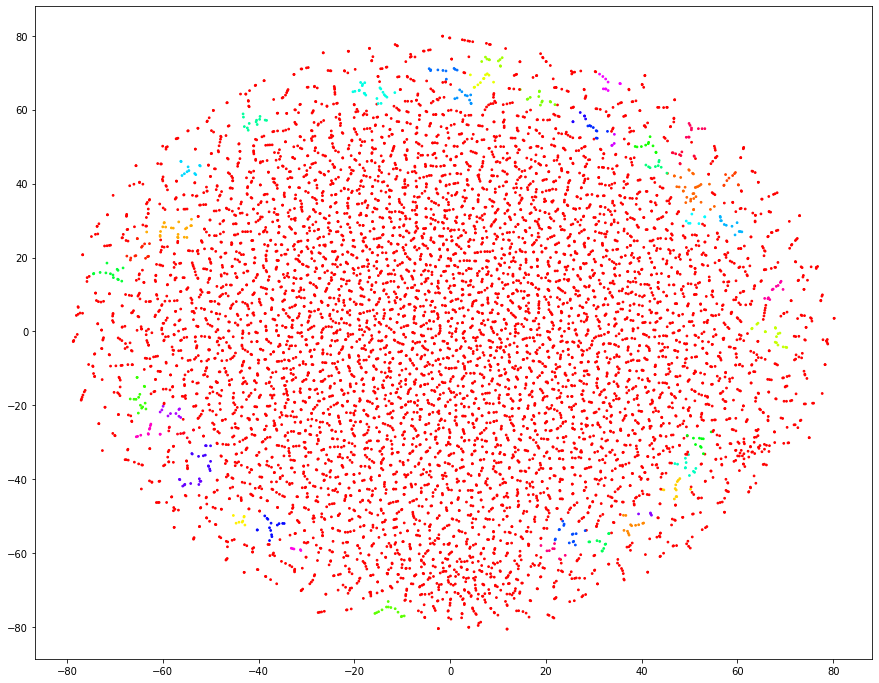

Model: DistMult
Forward mean rank evaluation: 538.7839965820312
Backward mean rank evaluation: 833.5433349609375
Head-Tail mean rank evaluation: 686.1636962890625
Mean-reciprocal rank evaluation: 0.15944897460937502
Hits@1 evaluation: 0.09
Hits@10 evaluation: 0.294


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


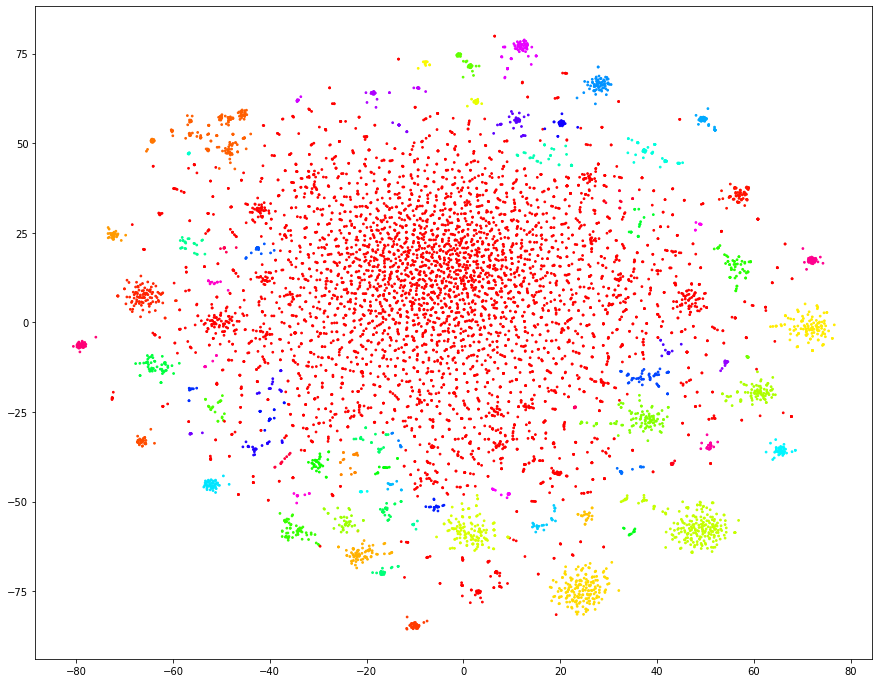

Model: ConvE
Forward mean rank evaluation: 1599.3466796875
Backward mean rank evaluation: 1095.5826416015625
Head-Tail mean rank evaluation: 1347.4647216796875
Mean-reciprocal rank evaluation: 0.09277052815755209
Hits@1 evaluation: 0.05633333333333333
Hits@10 evaluation: 0.16233333333333333


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


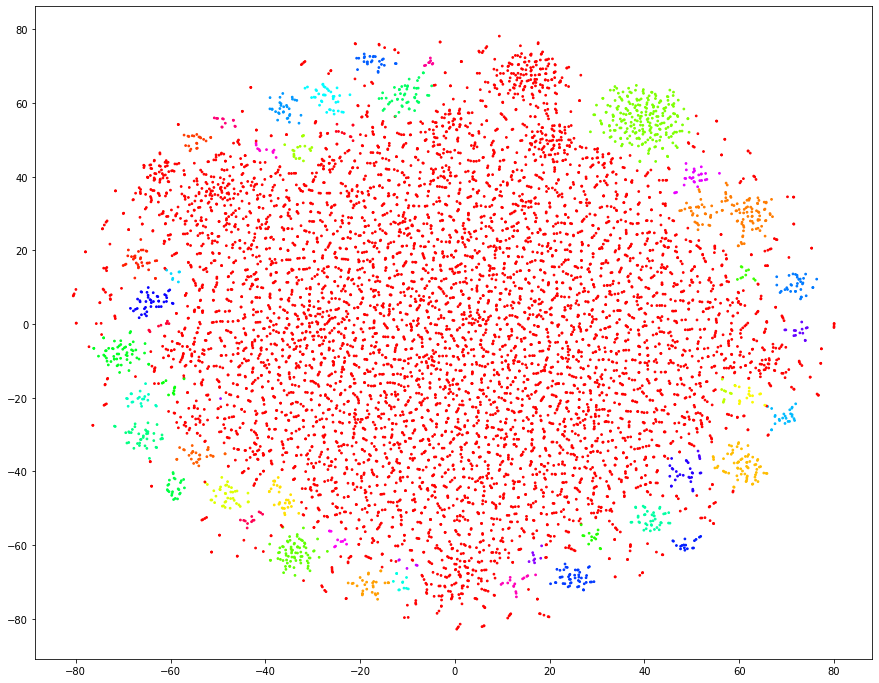

Model: QuatE
Forward mean rank evaluation: 702.2000122070312
Backward mean rank evaluation: 724.2093505859375
Head-Tail mean rank evaluation: 713.2046508789062
Mean-reciprocal rank evaluation: 0.21911285400390623
Hits@1 evaluation: 0.13833333333333334
Hits@10 evaluation: 0.377


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


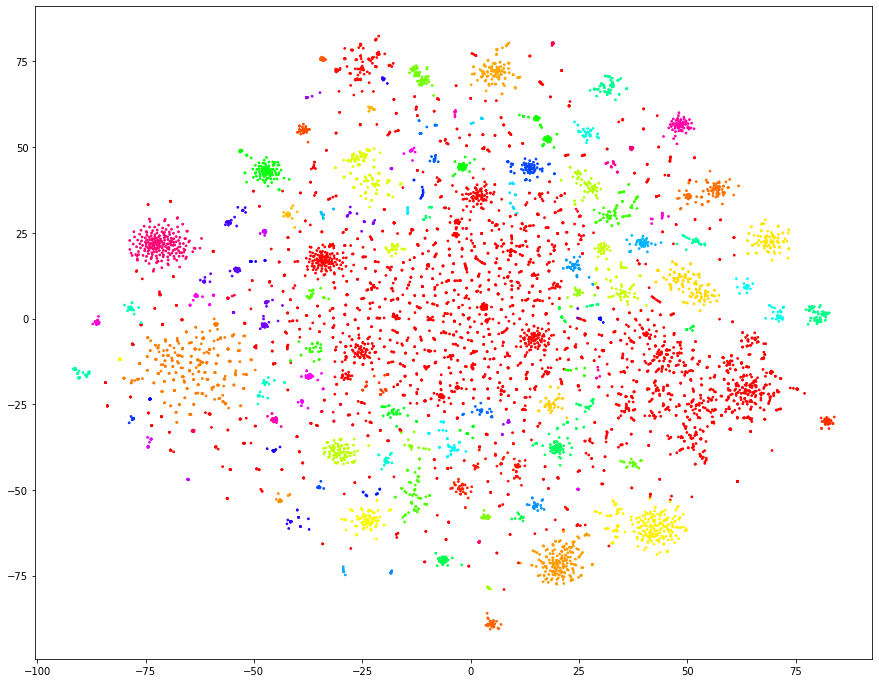

Model: BoxE
Forward mean rank evaluation: 133.50267028808594
Backward mean rank evaluation: 205.07566833496094
Head-Tail mean rank evaluation: 169.28916931152344
Mean-reciprocal rank evaluation: 0.2837161661783854
Hits@1 evaluation: 0.19033333333333333
Hits@10 evaluation: 0.4716666666666667


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


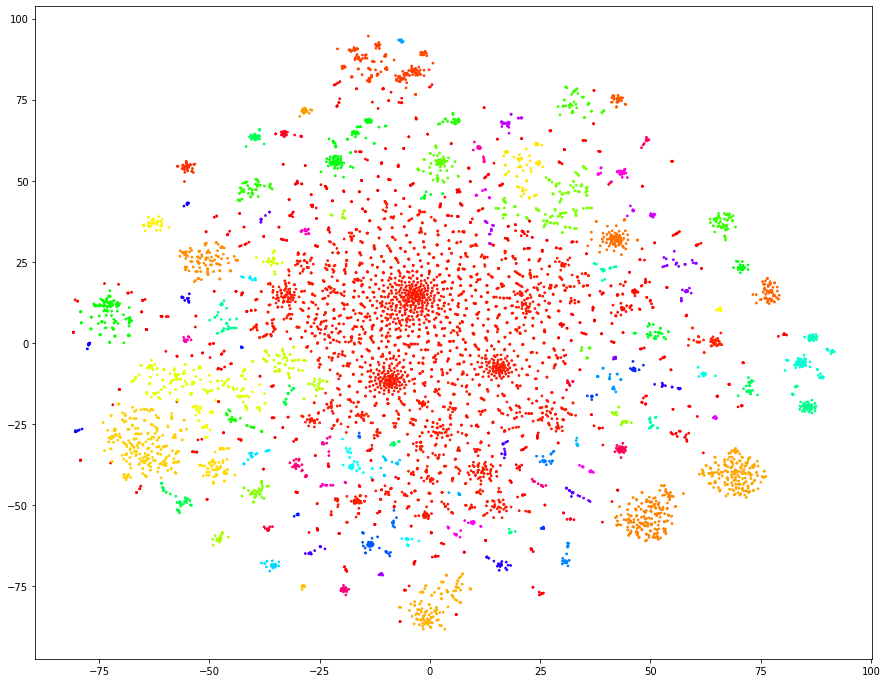

In [ ]:
def plot_interactive_pyk(entity_embedding_tensor, cluster = False):

  entity_emb_orig = entity_embedding_tensor.cpu().detach().numpy()
  entity_emb_orig_norm = normalize(entity_emb_orig)

  entity_emb_2d = TSNE(n_components=2, random_state=42).fit_transform(entity_emb_orig_norm)

  x = entity_emb_2d[:,0]
  y = entity_emb_2d[:,1]
  names = [label_name_entmap[id_label_entmap[i]] for i in range(entity_emb_2d.shape[0])]

  if cluster:
    db = DBSCAN(eps=3, min_samples=10).fit(entity_emb_2d)
    c = db.labels_
    n_clusters = max(c)
  else:
    c = [random.randint(1,10) for i in range(len(x))]
    n_clusters = 10

  norm = plt.Normalize(1,n_clusters)
  cmap = plt.cm.hsv

  fig = plt.figure(figsize=(15, 12))
  ax = plt.subplot()
  sc = plt.scatter(x,y,c=c, s=3, cmap=cmap, norm=norm)

  annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
                      bbox=dict(boxstyle="round", fc="w"),
                      arrowprops=dict(arrowstyle="->"))
  annot.set_visible(False)

  def update_annot(ind):

      pos = sc.get_offsets()[ind["ind"][0]]
      annot.xy = pos
      text = [names[n] for n in ind["ind"]][0]
      annot.set_text(text)
      annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
      annot.get_bbox_patch().set_alpha(1)


  def hover(event):
      vis = annot.get_visible()
      if event.inaxes == ax:
          cont, ind = sc.contains(event)
          if cont:
              update_annot(ind)
              annot.set_visible(True)
              fig.canvas.draw_idle()
          else:
              if vis:
                  annot.set_visible(False)
                  fig.canvas.draw_idle()

  fig.canvas.mpl_connect("motion_notify_event", hover)

  plt.show()

for model_name in models:
  print("Model:", model_name)

  print("Forward mean rank evaluation:",  results[model_name].get_metric('head.realistic.mean_rank'))
  print("Backward mean rank evaluation:",  results[model_name].get_metric('tail.realistic.mean_rank'))
  print("Head-Tail mean rank evaluation:",  results[model_name].get_metric('both.realistic.mean_rank'))

  print("Mean-reciprocal rank evaluation:",  results[model_name].get_metric('both.realistic.mrr'))
  print("Hits@1 evaluation:",  results[model_name].get_metric('both.realistic.hits_at_1'))
  print("Hits@10 evaluation:",  results[model_name].get_metric('both.realistic.hits_at_10'))

  model = results[model_name].model

  entity_embeddings = model.entity_representations[0]
  relation_embeddings = model.relation_representations[0]

  entity_embedding_tensor = entity_embeddings()
  relation_embedding_tensor = relation_embeddings()

  plot_interactive_pyk(entity_embedding_tensor, cluster=True)

# Implementing KEPLER
Reference paper: https://arxiv.org/pdf/1911.06136.pdf  
Reference repository: https://github.com/THU-KEG/KEPLER

From the paper abstract:  
Pre-trained language representation models cannot well capture factual knowledge from text. In contrast, knowledge
embedding (KE) methods can effectively
represent the relational facts in knowledge
graphs (KGs) with informative entity embeddings, but conventional KE models cannot
take full advantage of the abundant textual
information. In this paper, we propose a
unified model for Knowledge Embedding
and Pre-trained LanguagE Representation
(KEPLER), which can not only better integrate factual knowledge into PLMs but
also produce effective text-enhanced KE
with the strong PLMs. In KEPLER, we encode textual entity descriptions with a PLM
as their embeddings, and then jointly optimize the KE and language modeling objectives.

In practice this works similarly to TransE, but the embeddings of entities are obtained through a transformer model which is also trained under the TransE objective.  
The original implementation was done with the fairseq library, butwe re-implement it here with huggingface transformers.

In the paper they present multiple versions of the model.  
First of all they pretrain a MLM on entity descriptions, since we can't computationally do that, this step will be simulated by taking a model already pretrained on some kind of Wikipedia-like dataset.  
They also present a lot of model variations, what we will do is re-implement:
- KEPLER-Wiki, which uses both MLM and KE objective and the entity description as embedding method (relations embedding do not use further information)
- KEPLER-KE, which is like the latter but uses only the KE objective


By the way the paper description and implementation are different:
- Implementation uses 2-norm for TransE instead of 1-norm
- Paper says it uses a single negative sample, not two

## Data preparation
The model needs joint Masked Language Modeling and Knowledge Embedding (based on TransE) training.  
Thus we need to create these two datasets.

### Masked language modeling
In the paper it is explained that the main idea behind keeping the MLM objective is to not let the model forget its pretraining and ability to be a language model.  
The MLM dataset does not need to be based on the same data as the KE dataset, in fact in the paper they use both book corpus and wikipedia, but since we already have our descriptions from Wikipedia we may as well use them.  

The steps to create a MLM dataset are as follows:
- Tokenize the documents in input
- Dissect the documents into chunks of the same length, in this way we don't have problems with the model learning padding

In [ ]:
def create_MLM_dataset(raw_dataset, tokenizer, max_length = 512):
  def tokenize_function(examples):
      result = tokenizer(examples["text"], truncation=True, max_length=max_length)
      if tokenizer.is_fast:
          result["word_ids"] = [result.word_ids(i) for i in range(len(result["input_ids"]))]
      return result

  mlm_tokenized_dataset = mlm_raw_dataset.map(
      tokenize_function, batched=True, remove_columns=["text"]
  )

  chunk_size = 128

  def group_texts(examples):
      # Concatenate all texts
      concatenated_examples = {k: sum(examples[k], []) for k in examples.keys()}
      # Compute length of concatenated texts
      total_length = len(concatenated_examples[list(examples.keys())[0]])
      # We drop the last chunk if it's smaller than chunk_size
      total_length = (total_length // chunk_size) * chunk_size
      # Split by chunks of max_len
      result = {
          k: [t[i : i + chunk_size] for i in range(0, total_length, chunk_size)]
          for k, t in concatenated_examples.items()
      }
      # Create a new labels column
      result["labels"] = result["input_ids"].copy()
      return result

  mlm_dataset = mlm_tokenized_dataset.map(group_texts, batched=True)
  return mlm_dataset

### Knowledge embedding 
The knowledge embedding training part is augmented with negative sampling, which we don't have in the original triples dataset.  
In particular for each of the original triples $(h,r,t)$ we sample a fake tail $h'$ and a fake tail $t'$, thus making the triples dataset into a quintuple dataset $(h,r,t,h',t')$.  
To do so we have to make sure that the fake head/tail does not create and existing relationship, i.e. $(h,r,t')$ and $(h',r,t)$ do not exist in the dataset.

Once we have this quintuple of identifiers we have to map them to the representation that our KEPLER model needs, that is:
- $r$ has to be mapped to an integer
- all the entities have to be encoded to a textual representation, that is the description corresponding to the entity, after obtaining the representation we save the result of the tokenization into the dataset

In [ ]:
def create_KE_dataset(triples_dataset, entities, entity_to_text, max_length=512):
  # For each head find all its possible tails and vice versa
  valid_tail_for_head = {}
  valid_head_for_tail = {}
  for trip in triples_dataset.triples:
    head = trip[0].item()
    tail = trip[2].item()
    if not head in valid_tail_for_head:
      valid_tail_for_head[head] = set()
    valid_tail_for_head[head].add(tail)

    if not tail in valid_head_for_tail:
      valid_head_for_tail[tail] = set()
    valid_head_for_tail[tail].add(head)

  entity_list = list(entities)
  # Create raw KE dataset, where a record contains:
  # - head identifier, relation identifier, tail identifier
  # - negative head identifier, negative tail identifier
  KE_records = []
  for trip in triples_dataset.triples:
    # Get the true identifiers
    row = {"head":trip[0], "relation":trip[1], "tail":trip[2]}

    # Generate negative tail
    neg_tail = None
    while neg_tail is None:
      # Sample a random entity
      sampled = random.sample(entity_list, 1)[0]
      # Check that the head and the generated neg tail do not have relations
      if not sampled in valid_tail_for_head[trip[0].item()]:
        neg_tail = sampled
    row["nTail"] = neg_tail

    # Generate negative head
    neg_head = None
    while neg_head is None:
      # Sample a random entity
      sampled = random.sample(entity_list, 1)[0]
      # Check that the tail and the generated neg head do not have relations
      if not sampled in valid_head_for_tail[trip[2].item()]:
        neg_head = sampled
    row["nHead"] = neg_head

    KE_records.append(row)

  KE_df = pd.DataFrame(KE_records)
  KE_raw_dataset = Dataset.from_pandas(KE_df)

  # Replace the identifiers with tokenized descriptions
  relation_mapper = {}
  tok_cacher = {} # To not have to tokenize same description multiple times

  def tokenize_KE(sample):
    out = {}
    written = 0
    head_name = label_name_entmap[sample["head"]]
    tail_name = label_name_entmap[sample["tail"]]
    nTail_name = label_name_entmap[sample["nTail"]]
    nHead_name = label_name_entmap[sample["nHead"]]

    if not head_name in tok_cacher:
      head_desc = entity_to_text[head_name]
      tok_head = tokenizer(head_desc, truncation=True, padding="max_length", max_length=max_length)
      out["head_input_ids"] = tok_head["input_ids"]
      out["head_attention_mask"] = tok_head["attention_mask"]
      # Add to cache
      # For the attention mask just add a number, that is the index of the first 0 in the attention mask
      try:
        tok_cacher[head_name] = (tok_head["input_ids"], tok_head["attention_mask"].index(0))
      except:
        tok_cacher[head_name] = (tok_head["input_ids"], -1)
      written += 1
    else:
      out["head_input_ids"] = tok_cacher[head_name][0]
      mask_pos = tok_cacher[head_name][1]
      mask = np.ones_like(tok_cacher[head_name][0])
      if mask_pos != -1:
        mask[mask_pos:] = [0]*(len(mask)-mask_pos)
      out["head_attention_mask"] = mask

    if not tail_name in tok_cacher:
      tail_desc = entity_to_text[tail_name]
      tok_tail = tokenizer(tail_desc, truncation=True, padding="max_length", max_length=max_length)
      out["tail_input_ids"] = tok_tail["input_ids"]
      out["tail_attention_mask"] = tok_tail["attention_mask"]
      # Add to cache
      try:
        tok_cacher[tail_name] = (tok_tail["input_ids"],tok_tail["attention_mask"].index(0))
      except:
        tok_cacher[tail_name] = (tok_tail["input_ids"], -1)
      written += 1
    else:
      out["tail_input_ids"] = tok_cacher[tail_name][0]
      mask_pos = tok_cacher[tail_name][1]
      mask = np.ones_like(tok_cacher[tail_name][0])
      if mask_pos != -1:
        mask[mask_pos:] = [0]*(len(mask)-mask_pos)
      out["tail_attention_mask"] = mask

    if not nTail_name in tok_cacher:
      nTail_desc = entity_to_text[nTail_name]
      tok_nTail = tokenizer(nTail_desc, truncation=True, padding="max_length", max_length=max_length)
      out["nTail_input_ids"] = tok_nTail["input_ids"]
      out["nTail_attention_mask"] = tok_nTail["attention_mask"]
      # Add to cache
      try:
        tok_cacher[nTail_name] = (tok_nTail["input_ids"], tok_nTail["attention_mask"].index(0))
      except:
        tok_cacher[nTail_name] = (tok_nTail["input_ids"], -1)
      written += 1
    else:
      out["nTail_input_ids"] = tok_cacher[nTail_name][0]
      mask_pos = tok_cacher[nTail_name][1]
      mask = np.ones_like(tok_cacher[nTail_name][0])
      if mask_pos != -1:
        mask[mask_pos:] = [0]*(len(mask)-mask_pos)
      out["nTail_attention_mask"] = mask

    if not nHead_name in tok_cacher:
      nHead_desc  = entity_to_text[nHead_name]
      tok_nHead = tokenizer(nHead_desc, truncation=True, padding="max_length", max_length=max_length)
      out["nHead_input_ids"] = tok_nHead["input_ids"]
      out["nHead_attention_mask"] = tok_nHead["attention_mask"]
      # Add to cache
      try:
        tok_cacher[nHead_name] = (tok_nHead["input_ids"], tok_nHead["attention_mask"].index(0))
      except:
        tok_cacher[nHead_name] = (tok_nHead["input_ids"], -1)
      written += 1
    else:
      out["nHead_input_ids"] = tok_cacher[nHead_name][0]
      mask_pos = tok_cacher[nHead_name][1]
      mask = np.ones_like(tok_cacher[nHead_name][0])
      if mask_pos != -1:
        mask[mask_pos:] = [0]*(len(mask)-mask_pos)
      out["nHead_attention_mask"] = mask    

    # Encode relation as an id
    if sample["relation"] in relation_mapper:
      out["relation_id"] = relation_mapper[sample["relation"]]
    else:
      relation_mapper[sample["relation"]] = len(relation_mapper)
      out["relation_id"] = relation_mapper[sample["relation"]]
      
    return out

  KE_tokenized = KE_raw_dataset.map(tokenize_KE, batched=False, remove_columns=["head", "relation", "tail", "nTail", "nHead"], 
                                    writer_batch_size=500, keep_in_memory=False)

  return KE_tokenized, relation_mapper

## Model

Our model has to be able to embed both the entities and the relation.  
Since we went for the KEPLER-Wiki model presented in the paper, the relation is embedded through a linear layer/embedding layer which is progressively learned.  
On the other hand the entity representations are obtained from the pooled output of a language model.  
The model also implements the TransE scoring function: $$ d_r(h,t)=||h+r-t||_p$$
As for the p here, in the paper it's written they use $p=1$, in the implementation they use $p=2$, we are using 2.

As an implementation detail, for ease of use the language model embedder is added to the model as a standalone entity which represent a model trainable by masked LM. The actual embedder part is extracted from this more encompassing entity and is used when we need to perform entity embedding. When we need to perform the forward pass during MLM training we just use the entire entity.

In [ ]:

class KEPLER_EntityDOnly(nn.Module):

  def __init__(self, encoder_model, num_relations, margin, encoder_family = 'roberta'):
    super(KEPLER_EntityDOnly, self).__init__()
    self.encoder_family = encoder_family
    # Instantiate encoder model
    if encoder_family=='roberta':
      self.encoder = AutoModelForMaskedLM.from_pretrained(encoder_model, from_tf=True)
    elif encoder_family == 'bigbird':
      self.encoder = AutoModelForMaskedLM.from_pretrained(encoder_model)
    elif encoder_family == 'bert':
      self.encoder = AutoModelForMaskedLM.from_pretrained(encoder_model)

    # Define relation embedding
    self.embedder = nn.Embedding(num_embeddings = num_relations, embedding_dim = self.encoder.config.hidden_size)
    self.margin = margin
    
  def encode_entity(self, x):
    # Pass an entity description under the encoder
    if self.encoder_family == 'roberta':
      out = self.encoder.roberta(**x) # -> Works for roberta
      out_pool = torch.mean(out.last_hidden_state, axis=1)
    elif self.encoder_family == 'bert':
      out = self.encoder.bert(**x) # -> Works for bert
      out_pool = torch.mean(out.last_hidden_state, axis=1)
    elif self.encoder_family == 'bigbird':
      out = self.encoder.bert(**x) # -> Why bert???
      out_pool = torch.mean(out.last_hidden_state, axis=1)

    return out_pool
  
  def encode_relation(self, x):
    # Return the embedding for that relation
    out = self.embedder(x)
    return out
  
  def mlm_forward(self, x):
    out = self.encoder(**x)
    return out
  
  def distance_measure(self, h, t, r, lib='torch'):
    # TransE distance measure/objective
    if lib == 'torch':
      return torch.norm(h+r-t, p=2, dim=-1)
    elif lib == 'np':
      return np.linalg.norm(h+r-t, ord=2)

### Training
As for the loss function, we can either use the joint MLM + KE loss or only the KE loss.  
The MLM loss is the standard one, categorical cross entropy over masked tokens.  
The Knowledge embedding loss is defined as:
$$\mathcal{L}_{KE}=-log(\sigma(\gamma - d_r(h,t)) -\sum_{i=1}{\frac{1}{n}log(\sigma(d_r(h^\mathbb{n}_i,t^\mathbb{n}_i) - \gamma)}  $$
Here we sum the positive part of the loss, computed from the original triple, to the negative part of the loss.  
In our case the negative part of the loss is composed of the fake tail triple $(h,r,t')$ and the fake head triple $(h',r,t)$, so it effctively becomes:
$$ \mathcal{L}_{KE}=-log(\sigma(\gamma - d_r(h,t)) - \frac{1}{2}(log(\sigma(d_r(h,t') - \gamma) + log(\sigma(d_r(h',t) - \gamma))) $$

In [ ]:
# Losses
import torch
from torch.nn.functional import logsigmoid

def MLM_loss(model, batch):
  # Your usual MLM objective, cat cross entropy over masked tokens
  # Uses the fact that we are using a LMForMLM in the model
  del batch["word_ids"]
  outputs = model.mlm_forward(batch)
  loss = outputs.loss
  return loss

def KE_loss(model, batch):
  # Steps for each sample in batch:
  # 1) Encode each head, tail, nHead, nTail using roberta
  # 2) Encode the relation
  # 3) Compute − log σ(γ − d_r(h, t)) -> positive part of loss
  # 4) Compute the average of the negative part of the loss
  # 5) Sum them
  head_encoded = model.encode_entity({'input_ids':batch["head_input_ids"], 'attention_mask':batch["head_attention_mask"]})
  tail_encoded = model.encode_entity({'input_ids':batch["tail_input_ids"], 'attention_mask':batch["tail_attention_mask"]})
  nHead_encoded = model.encode_entity({'input_ids':batch["nHead_input_ids"], 'attention_mask':batch["nHead_attention_mask"]})
  nTail_encoded = model.encode_entity({'input_ids':batch["nTail_input_ids"], 'attention_mask':batch["nTail_attention_mask"]})

  relation_encoded = model.encode_relation(batch["relation_id"])

  pos_part = logsigmoid(model.margin - model.distance_measure(head_encoded, tail_encoded, relation_encoded))

  neg_part = 0.5*(logsigmoid(model.distance_measure(head_encoded, nTail_encoded, relation_encoded) - model.margin) +
                  logsigmoid(model.distance_measure(nHead_encoded, tail_encoded, relation_encoded) - model.margin))

  out_loss = -pos_part-neg_part

  return torch.mean(out_loss, dim=-1)



In [ ]:
from torch.utils.data import DataLoader
from transformers import DataCollatorForLanguageModeling
import transformers
from torch.optim import AdamW

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Training routine
def train_model(model_type, n_epochs, margin, train_KE, train_MLM=None, batch_size = 8, joint_mlm = False, model_family ="roberta", learning_rate=1e-4, vis=500):
  model = KEPLER_EntityDOnly(model_type, len(relations), margin, model_family)
  model = model.to(device)

  optimizer = AdamW(model.parameters(), lr=learning_rate)

  # Dataloaders/Dataset creation
  # MLM
  if joint_mlm:
    tokenizer.pad_token = tokenizer.eos_token
    if tokenizer.pad_token is None:
      tokenizer.add_special_tokens({'pad_token': '[PAD]'})

    data_collator_mlm = DataCollatorForLanguageModeling(tokenizer=tokenizer, mlm_probability=0.15)

    train_MLM_t = train_MLM.with_format("torch", device=device)
    mlm_dl = DataLoader(train_MLM_t["train"], batch_size=batch_size, collate_fn=data_collator_mlm, shuffle=True)

  # KE
  train_KE_t = train_KE.with_format("torch", device=device)
  ke_dl = DataLoader(train_KE_t, batch_size=batch_size, shuffle=True)

  ##
  num_update_steps_per_epoch = len(ke_dl)
  num_training_steps = n_epochs * num_update_steps_per_epoch

  lr_scheduler = transformers.get_polynomial_decay_schedule_with_warmup(
      optimizer=optimizer,
      num_warmup_steps=num_training_steps//10,
      num_training_steps=num_training_steps)
  
  # Training routine
  for epoch in range(n_epochs):
    print("Epoch:", epoch+1)
    # Training
    model.train()
    
    if joint_mlm:
      mlm_dl_iter = iter(mlm_dl)
    train_loss = []
    i = 0
    for batch_ke in ke_dl:

      ke_loss = KE_loss(model, batch_ke)
      if joint_mlm:
        batch_mlm = next(mlm_dl_iter)
        batch_mlm = {k:batch_mlm[k].to(device) for k in batch_mlm}

        mlm_loss = MLM_loss(model, batch_mlm)
        
        loss = mlm_loss + ke_loss
      else:
        loss = ke_loss
      loss.backward()

      optimizer.step()
      lr_scheduler.step()
      optimizer.zero_grad()
      train_loss.append(loss.item())
      if i % vis == 0:
        print(f"{i}/{len(ke_dl)} - Loss: {np.mean(train_loss):.2f}")
      i += 1
    print(f"Epoch Loss: {np.mean(train_loss):.2f}")
  return model


## Evaluation
Like we introduced before we are going to perform a mean rank, head only and realistic evaluation.  
In general the direction of the evaluation can be:
- from head to tail, if we evaluate the predictive capabilities based on $(h,r) → (h,r,t)$
- from tail to head, if we evaluate the predictive capabilities based on $(t,r) → (h,r,t)$
- bidirectional if we consider both
In this we used the head to tail prediction since TransE based models are not fit to perform the inverse.

Let's assume we are performing tail prediction and that multiple tails $t'$ are possible, to perform mean rank evaluation we can either:
- take the lowest rank assigned among all valid tails (optimistic)
- take the highest rank assigned among all valid tails (pessimistic)
- take the mean of the latter two cases (realistic)

To perform the evaluation we set up we have to take the following steps for each triple:
- Take its real head $h$ and relation $r$
- For each possible tail entity $t'$ obtain its score
- Rank all of the possible tail entities
- For all valid tail entities (the ground truth $t$ and all the other possible ones for the same $(h,r)$ pair) check their rank
- Take the realistic rank
And finally average all these ranks

As for **Mean Reciprocal Rank**, it takes into account the direction of the prediction and is defined as:
$$
MRR(Q) = \frac{1}{|Q|}\sum_{i}^{Q} \frac{1}{R_i}
$$
Where Q contains all rank-predictions for all samples and $R_i$ represents the rank of the best-ranked ground truth for sample $i$.

**Hits@K** works similarly to MRR in the sense that it defined as the number of ground truth hits in the top K ranked possibilities.


In [ ]:
from operator import itemgetter
# Mean rank evaluation
# We will re-implement head, realistic, mean rank

def get_entity_embeddings(model, tokenizer, entities, label_to_name, entities_to_text, max_length=512):
  embedding_map = {}
  for en in entities:
    # Get text and tokenize it
    entity_tokenized = tokenizer(entities_to_text[label_to_name[en]], truncation=True, padding="max_length", max_length=max_length, return_tensors="pt")
    entity_tokenized = {k:entity_tokenized[k].to(device) for k in entity_tokenized}
    # Obtain embedding
    with torch.no_grad():
      entity_embedding = model.encode_entity(entity_tokenized).cpu().numpy()
    embedding_map[en] = np.squeeze(entity_embedding)

  return embedding_map

def get_relation_embeddings(model, relations, relations_to_id):
  embedding_map = {}
  for rel in relations:
    rel_id = torch.as_tensor(relations_to_id[rel]).to(device)
    # Obtain embedding
    with torch.no_grad():
      rel_embedding = model.encode_relation(rel_id).cpu().numpy()
    embedding_map[rel] = np.squeeze(rel_embedding)

  return embedding_map

def score_entities(model, entity, relation, entity_embed, relation_embed, input_tail = False):
  entities = list(entity_embed.keys())

  entity_score = {}
  for e2 in entities:
    e1_embed = entity_embed[entity]
    e2_embed = entity_embed[e2]
    rel_embed = relation_embed[relation]
    if not input_tail:
      entity_score[e2] = model.distance_measure(e1_embed, e2_embed, rel_embed, lib='np')
    else:
      entity_score[e2] = model.distance_measure(e2_embed, e1_embed, rel_embed, lib='np')

  entity_rank = list(entity_score.items())
  sorted_entities = sorted(entity_rank, key=itemgetter(1))
  entity_rank = {sorted_entities[i][0]:i+1 for i in range(len(sorted_entities))}

  return entity_score, entity_rank

def compute_metrics(model, triples, entity_embeddings, relation_embeddings):
  # Get all valid heads and tails for each entity and relation
  all_valid_tails = {}
  all_valid_heads = {}
  for trip in triples:
    h = trip[0].item()
    r = trip[1].item()
    t = trip[2].item()

    if h not in all_valid_tails:
      all_valid_tails[h] = {}
    if r not in all_valid_tails[h]:
      all_valid_tails[h][r] = set()
    all_valid_tails[h][r].add(t)

    if t not in all_valid_heads:
      all_valid_heads[t] = {}
    if r not in all_valid_heads[t]:
      all_valid_heads[t][r] = set()
    all_valid_heads[t][r].add(h)

  trip_ranks_f = []
  trip_ranks_b = []

  f_first = []
  b_first = []
  for trip in triples:
    head = trip[0].item()
    rel = trip[1].item()
    tail = trip[2].item()

    # Head ranking
    scoring, ranks = score_entities(model, head, rel, entity_embeddings, relation_embeddings)

    # Get all valid tails for this head-relation pair
    valid_tails = all_valid_tails[head][rel]
    tails_ranks = {t:ranks[t] for t in valid_tails}
    tails_scores = {t:scoring[t] for t in valid_tails}

    # Compute optimistic and pessimistic rank and average them to get 
    # Realistic rank
    forward_rank = (min(tails_ranks.values()) + max(tails_ranks.values()))/2
    trip_ranks_f.append(forward_rank)
    f_first.append(min(tails_ranks.values()))

    # Head ranking
    scoring, ranks = score_entities(model, tail, rel, entity_embeddings, relation_embeddings, input_tail=True)

    # Get all valid tails for this head-relation pair
    valid_heads = all_valid_heads[tail][rel]
    heads_ranks = {t:ranks[t] for t in valid_heads}
    heads_scores = {t:scoring[t] for t in valid_heads}

    # Compute optimistic and pessimistic rank and average them to get 
    # Realistic rank
    back_rank = (min(heads_ranks.values()) + max(heads_ranks.values()))/2
    b_first.append(min(heads_ranks.values()))

    trip_ranks_b.append(back_rank)
  
  metrics = {
      "f_mean_rank":np.mean(trip_ranks_f),
      "b_mean_rank":np.mean(trip_ranks_b),
  }
  trips_ranks = np.mean([trip_ranks_f, trip_ranks_b], axis=0)
  metrics["mean_rank"] = np.mean(trips_ranks)

  metrics["mean_reciprocal_rank_f"] = np.mean(1/np.asarray(f_first))
  metrics["mean_reciprocal_rank_b"] = np.mean(1/np.asarray(b_first))
  metrics["mean_reciprocal_rank"] = (metrics["mean_reciprocal_rank_f"] +  metrics["mean_reciprocal_rank_b"])/2
  metrics["hits_at_1_f"] = np.mean(np.asarray([1 if v == 1 else 0 for v in f_first]))
  metrics["hits_at_1_b"] = np.mean(np.asarray([1 if v == 1 else 0 for v in b_first]))
  metrics["hits_at_1"] = (metrics["hits_at_1_f"] +  metrics["hits_at_1_b"])/2
  metrics["hits_at_10_f"] = np.mean(np.asarray([1 if v <= 10 else 0 for v in f_first]))
  metrics["hits_at_10_b"] = np.mean(np.asarray([1 if v <= 10 else 0 for v in b_first]))
  metrics["hits_at_10"] = (metrics["hits_at_10_f"] +  metrics["hits_at_10_b"])/2

  return metrics

## Visualization

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.widgets import Button
from matplotlib.text import Annotation
from sklearn.cluster import DBSCAN, OPTICS, AgglomerativeClustering
from sklearn.metrics import silhouette_score

import seaborn as sns

def plot_interactive_kep(entity_embedding_map, cluster = False):
  map_as_list = list(entity_embedding_map.items())

  entity_embedding_tensor = np.asarray([v[1] for v in map_as_list])
  entity_list = [label_name_entmap[v[0]] for v in map_as_list]

  entity_emb_orig = np.asarray(entity_embedding_tensor)
  entity_emb_orig_norm = normalize(entity_embedding_tensor)

  entity_emb_2d = TSNE(n_components=2, random_state=42).fit_transform(entity_emb_orig_norm)

  x = entity_emb_2d[:,0]
  y = entity_emb_2d[:,1]
  names = np.array(entity_list)

  if cluster:
    db = DBSCAN(eps=3, min_samples=10).fit(entity_emb_2d)
    c = db.labels_
    n_clusters = max(c)
  else:
    c = [random.randint(1,10) for i in range(len(x))]
    n_clusters = 10

  norm = plt.Normalize(1,n_clusters)
  cmap = plt.cm.hsv

  fig = plt.figure(figsize=(15, 12))
  ax = plt.subplot()
  sc = plt.scatter(x,y,c=c, s=3, cmap=cmap, norm=norm)

  annot = ax.annotate("", xy=(0,0), xytext=(20,20),textcoords="offset points",
                      bbox=dict(boxstyle="round", fc="w"),
                      arrowprops=dict(arrowstyle="->"))
  annot.set_visible(False)

  def update_annot(ind):

      pos = sc.get_offsets()[ind["ind"][0]]
      annot.xy = pos
      text = [names[n] for n in ind["ind"]][0]
      annot.set_text(text)
      annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind["ind"][0]])))
      annot.get_bbox_patch().set_alpha(1)


  def hover(event):
      vis = annot.get_visible()
      if event.inaxes == ax:
          cont, ind = sc.contains(event)
          if cont:
              update_annot(ind)
              annot.set_visible(True)
              fig.canvas.draw_idle()
          else:
              if vis:
                  annot.set_visible(False)
                  fig.canvas.draw_idle()

  fig.canvas.mpl_connect("motion_notify_event", hover)

  plt.show()


# Results
We are going to evaluate 5 models:
- A KE-trained only Roberta
- A KE-MLM joint trained Roberta
- A KE-trained only Bert-Tiny
- A KE-MLM joint trained Bert-Tiny
- A KE trained Bigbird, since entity descriptions often exceed the context length of Roberta

Unfortunately due to resource constraints we can only train for a few epochs. 



## KE Roberta

In [ ]:
model_name = "Rocketknight1/distilroberta-base-finetuned-wikitext2"

# Instatiate the tokenizer
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained(model_name, max_length=512)

# Create KE dataset
KE_tokenized, relation_mapper = create_KE_dataset(wd_50_train, entities, entity_to_text)


  0%|          | 0/12000 [00:00<?, ?ex/s]

In [ ]:
trained_model = train_model(model_name, n_epochs=3, margin=4, batch_size=8, train_KE=KE_tokenized)

# Save model
torch.save(trained_model, "roberta_KE.pkl")

  0%|          | 0/12000 [00:00<?, ?ex/s]

All TF 2.0 model weights were used when initializing RobertaForMaskedLM.

All the weights of RobertaForMaskedLM were initialized from the TF 2.0 model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use RobertaForMaskedLM for predictions without further training.


Epoch: 1
0/1500 - Loss: 24.01
500/1500 - Loss: 20.39
1000/1500 - Loss: 18.73
Epoch Loss: 17.43
Epoch: 2
0/1500 - Loss: 10.09
500/1500 - Loss: 13.89
1000/1500 - Loss: 13.49
Epoch Loss: 13.22
Epoch: 3
0/1500 - Loss: 11.65
500/1500 - Loss: 11.69
1000/1500 - Loss: 11.57
Epoch Loss: 11.39


In [ ]:
# Load model
trained_model = torch.load("roberta_KE.pkl")

# Evaluation
trained_model.eval()
entity_embeddings = get_entity_embeddings(trained_model, tokenizer, entities, label_name_entmap, entity_to_text)
relation_embeddings = get_relation_embeddings(trained_model, relations, relation_mapper)

print("Evaluation on test set:")
metrics = compute_metrics(trained_model, wd_50_test.triples, entity_embeddings, relation_embeddings)
print("Forward mean rank evaluation:", metrics["f_mean_rank"])
print("Backward mean rank evaluation:", metrics["b_mean_rank"])
print("Mean rank evaluation:", metrics["mean_rank"])

print("Forward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_f"])
print("Backward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_b"])
print("Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank"])

print("Forward Hits@1:",  metrics["hits_at_1_f"])
print("Backward Hits@1:",  metrics["hits_at_1_b"])
print("Hits@1:",  metrics["hits_at_1"])

print("Forward Hits@10:",  metrics["hits_at_10_f"])
print("Backward Hits@10:",  metrics["hits_at_10_b"])
print("Hits@10:",  metrics["hits_at_10"])

Evaluation on test set:
Forward mean rank evaluation: 768.3853333333333
Backward mean rank evaluation: 586.254
Mean rank evaluation: 677.3196666666666
Forward Mean-reciprocal rank evaluation: 0.19744939025955577
Backward Mean-reciprocal rank evaluation: 0.12917979307926938
Mean-reciprocal rank evaluation: 0.1633145916694126
Forward Hits@1: 0.11933333333333333
Backward Hits@1: 0.07
Hits@1: 0.09466666666666668
Forward Hits@10: 0.3453333333333333
Backward Hits@10: 0.238
Hits@10: 0.29166666666666663


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


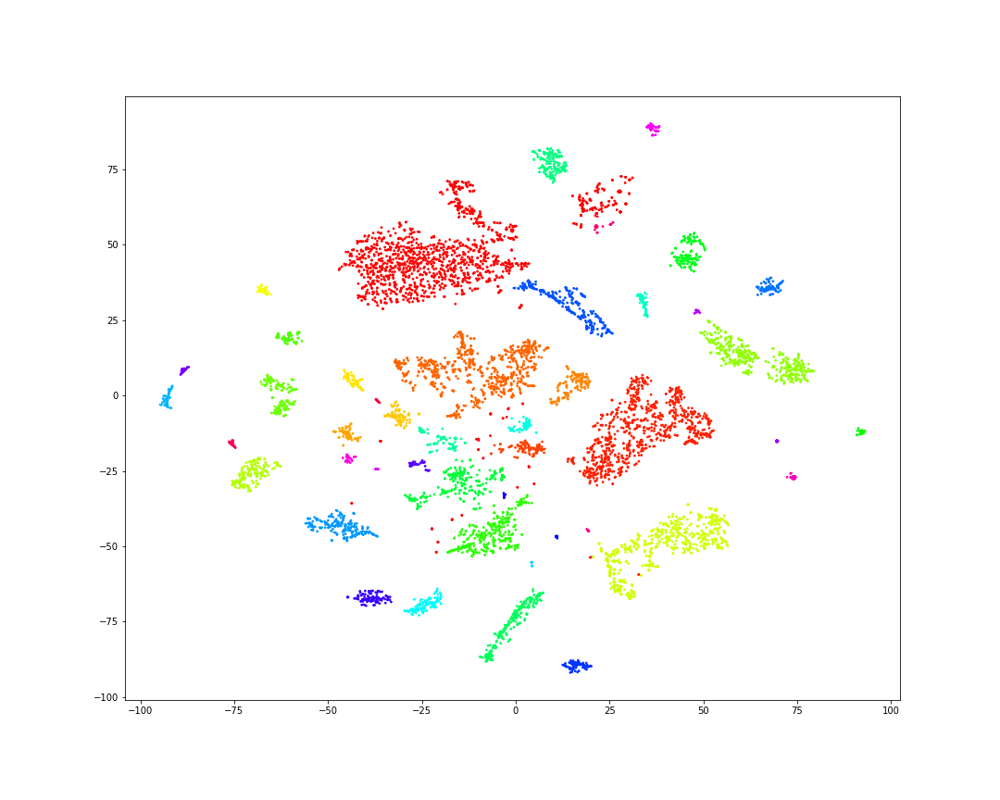

In [ ]:
plot_interactive_kep(entity_embeddings, cluster = True)

## KE-MLM Roberta

In [ ]:
model_name = "Rocketknight1/distilroberta-base-finetuned-wikitext2"
# Get all the entity texts into a list of strings
mlm_raw_dataset = load_dataset("text", data_files={"train": "entity_texts.txt"}, sample_by="line")

# Instatiate the tokenizer
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained(model_name, max_length=512)

# Create MLM dataset
mlm_dataset = create_MLM_dataset(mlm_raw_dataset, tokenizer)

# Create KE dataset
KE_tokenized, relation_mapper = create_KE_dataset(wd_50_train, entities, entity_to_text)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /root/.cache/huggingface/datasets/text/default-aca8d2afb0e75a8b/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?ba/s]

  0%|          | 0/8 [00:00<?, ?ba/s]

  0%|          | 0/12000 [00:00<?, ?ex/s]

In [ ]:
trained_model = train_model(model_name, n_epochs=3, margin=4, train_KE=KE_tokenized, train_MLM=mlm_dataset, joint_mlm=True)

# Save model
torch.save(trained_model, "roberta_KEMLM.pkl")

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /root/.cache/huggingface/datasets/text/default-aca8d2afb0e75a8b/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/355 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/798k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

  0%|          | 0/8 [00:00<?, ?ba/s]

  0%|          | 0/8 [00:00<?, ?ba/s]

  0%|          | 0/12000 [00:00<?, ?ex/s]

Downloading:   0%|          | 0.00/654 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/485M [00:00<?, ?B/s]

All TF 2.0 model weights were used when initializing RobertaForMaskedLM.

All the weights of RobertaForMaskedLM were initialized from the TF 2.0 model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use RobertaForMaskedLM for predictions without further training.


Epoch: 1


You're using a RobertaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


0/1500 - Loss: 26.51
500/1500 - Loss: 24.38
1000/1500 - Loss: 21.68
Epoch Loss: 20.12
Epoch: 2
0/1500 - Loss: 20.04
500/1500 - Loss: 15.30
1000/1500 - Loss: 15.20
Epoch Loss: 14.70
Epoch: 3
0/1500 - Loss: 17.06
500/1500 - Loss: 12.79
1000/1500 - Loss: 12.62
Epoch Loss: 12.52


In [ ]:
# Load model
trained_model = torch.load("roberta_KEMLM.pkl")

# Evaluation
trained_model.eval()
entity_embeddings = get_entity_embeddings(trained_model, tokenizer, entities, label_name_entmap, entity_to_text)
relation_embeddings = get_relation_embeddings(trained_model, relations, relation_mapper)

print("Evaluation on test set:")
metrics = compute_metrics(trained_model, wd_50_test.triples, entity_embeddings, relation_embeddings)
print("Forward mean rank evaluation:", metrics["f_mean_rank"])
print("Backward mean rank evaluation:", metrics["b_mean_rank"])
print("Mean rank evaluation:", metrics["mean_rank"])

print("Forward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_f"])
print("Backward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_b"])
print("Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank"])

print("Forward Hits@1:",  metrics["hits_at_1_f"])
print("Backward Hits@1:",  metrics["hits_at_1_b"])
print("Hits@1:",  metrics["hits_at_1"])

print("Forward Hits@10:",  metrics["hits_at_10_f"])
print("Backward Hits@10:",  metrics["hits_at_10_b"])
print("Hits@10:",  metrics["hits_at_10"])

Evaluation on test set:
Forward mean rank evaluation: 691.273
Backward mean rank evaluation: 514.927
Mean rank evaluation: 603.1
Forward Mean-reciprocal rank evaluation: 0.21177076633119468
Backward Mean-reciprocal rank evaluation: 0.10270256270678173
Mean-reciprocal rank evaluation: 0.1572366645189882
Forward Hits@1: 0.13733333333333334
Backward Hits@1: 0.04466666666666667
Hits@1: 0.091
Forward Hits@10: 0.368
Backward Hits@10: 0.21933333333333332
Hits@10: 0.29366666666666663


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


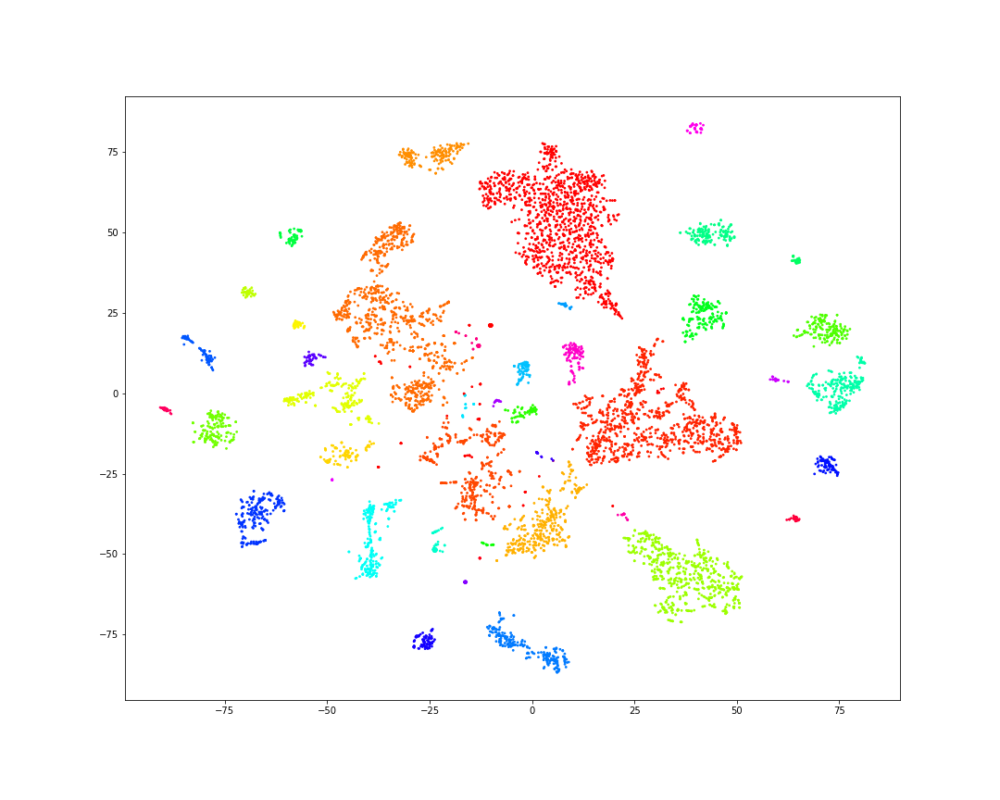

In [ ]:
plot_interactive_kep(entity_embeddings, cluster = True)

## KE Bert-Tiny

In [ ]:
model_name = "prajjwal1/bert-tiny"
# Get all the entity texts into a list of strings
mlm_raw_dataset = load_dataset("text", data_files={"train": "entity_texts.txt"}, sample_by="line")

# Instatiate the tokenizer
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

# Create MLM dataset
mlm_dataset = create_MLM_dataset(mlm_raw_dataset, tokenizer)

# Create KE dataset
KE_tokenized, relation_mapper = create_KE_dataset(wd_50_train, entities, entity_to_text)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?ba/s]

  0%|          | 0/8 [00:00<?, ?ba/s]

  0%|          | 0/12000 [00:00<?, ?ex/s]

In [ ]:
trained_model = train_model(model_name, n_epochs=10, margin=4, batch_size=32, train_KE=KE_tokenized, train_MLM=mlm_dataset, joint_mlm=True, model_family="bert", vis=100)

# Save model
torch.save(trained_model, "bertiny_KE.pkl")

Some weights of the model checkpoint at prajjwal1/bert-tiny were not used when initializing BertForMaskedLM: ['cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Using eos_token, but it is not set yet.
Using pad_token, but it is not set yet.


Epoch: 1


You're using a BertTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


0/375 - Loss: 12.61
100/375 - Loss: 12.62
200/375 - Loss: 12.19
300/375 - Loss: 11.88
Epoch Loss: 11.68
Epoch: 2
0/375 - Loss: 10.87
100/375 - Loss: 10.47
200/375 - Loss: 10.24
300/375 - Loss: 10.09
Epoch Loss: 10.00
Epoch: 3
0/375 - Loss: 9.00
100/375 - Loss: 9.38
200/375 - Loss: 9.29
300/375 - Loss: 9.21
Epoch Loss: 9.14
Epoch: 4
0/375 - Loss: 10.15
100/375 - Loss: 8.74
200/375 - Loss: 8.71
300/375 - Loss: 8.66
Epoch Loss: 8.61
Epoch: 5
0/375 - Loss: 7.76
100/375 - Loss: 8.40
200/375 - Loss: 8.36
300/375 - Loss: 8.31
Epoch Loss: 8.28
Epoch: 6
0/375 - Loss: 8.47
100/375 - Loss: 8.10
200/375 - Loss: 8.07
300/375 - Loss: 8.04
Epoch Loss: 8.03
Epoch: 7
0/375 - Loss: 7.67
100/375 - Loss: 7.83
200/375 - Loss: 7.85
300/375 - Loss: 7.82
Epoch Loss: 7.83
Epoch: 8
0/375 - Loss: 8.01
100/375 - Loss: 7.71
200/375 - Loss: 7.72
300/375 - Loss: 7.71
Epoch Loss: 7.70
Epoch: 9
0/375 - Loss: 7.44
100/375 - Loss: 7.61
200/375 - Loss: 7.60
300/375 - Loss: 7.62
Epoch Loss: 7.61
Epoch: 10
0/375 - Loss: 7.

In [ ]:
# Load model
trained_model = torch.load("bertiny_KE.pkl")

# Evaluation
trained_model.eval()
entity_embeddings = get_entity_embeddings(trained_model, tokenizer, entities, label_name_entmap, entity_to_text)
relation_embeddings = get_relation_embeddings(trained_model, relations, relation_mapper)

print("Evaluation on test set:")
metrics = compute_metrics(trained_model, wd_50_test.triples, entity_embeddings, relation_embeddings)
print("Forward mean rank evaluation:", metrics["f_mean_rank"])
print("Backward mean rank evaluation:", metrics["b_mean_rank"])
print("Mean rank evaluation:", metrics["mean_rank"])

print("Forward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_f"])
print("Backward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_b"])
print("Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank"])

print("Forward Hits@1:",  metrics["hits_at_1_f"])
print("Backward Hits@1:",  metrics["hits_at_1_b"])
print("Hits@1:",  metrics["hits_at_1"])

print("Forward Hits@10:",  metrics["hits_at_10_f"])
print("Backward Hits@10:",  metrics["hits_at_10_b"])
print("Hits@10:",  metrics["hits_at_10"])

Evaluation on test set:
Forward mean rank evaluation: 360.89633333333336
Backward mean rank evaluation: 672.2626666666666
Mean rank evaluation: 516.5795
Forward Mean-reciprocal rank evaluation: 0.22386390194278927
Backward Mean-reciprocal rank evaluation: 0.09735445550701592
Mean-reciprocal rank evaluation: 0.1606091787249026
Forward Hits@1: 0.15533333333333332
Backward Hits@1: 0.04466666666666667
Hits@1: 0.09999999999999999
Forward Hits@10: 0.342
Backward Hits@10: 0.192
Hits@10: 0.267


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


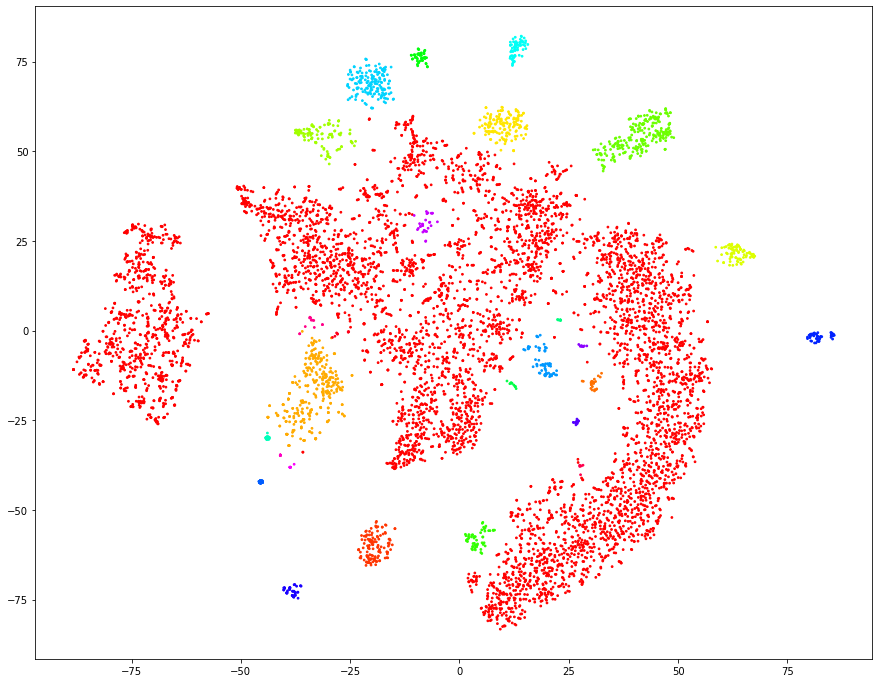

In [ ]:
plot_interactive_kep(entity_embeddings, cluster = True)

## KE-MLM Bert-Tiny

In [ ]:
model_name = "prajjwal1/bert-tiny"
# Get all the entity texts into a list of strings
mlm_raw_dataset = load_dataset("text", data_files={"train": "entity_texts.txt"}, sample_by="line")

# Instatiate the tokenizer
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

# Create MLM dataset
mlm_dataset = create_MLM_dataset(mlm_raw_dataset, tokenizer)

# Create KE dataset
KE_tokenized, relation_mapper = create_KE_dataset(wd_50_train, entities, entity_to_text)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?ex/s]

In [ ]:
trained_model = train_model(model_name, n_epochs=10, margin=4, batch_size=32, train_KE=KE_tokenized, train_MLM=mlm_dataset, joint_mlm=True, model_family="bert", vis=100)

# Save model
torch.save(trained_model, "bertiny_KEMLM.pkl")

Some weights of the model checkpoint at prajjwal1/bert-tiny were not used when initializing BertForMaskedLM: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Using eos_token, but it is not set yet.
Using pad_token, but it is not set yet.


Epoch: 1


You're using a BertTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


0/375 - Loss: 13.13
100/375 - Loss: 12.74
200/375 - Loss: 12.35
300/375 - Loss: 12.03
Epoch Loss: 11.82
Epoch: 2
0/375 - Loss: 10.65
100/375 - Loss: 10.64
200/375 - Loss: 10.43
300/375 - Loss: 10.27
Epoch Loss: 10.16
Epoch: 3
0/375 - Loss: 9.68
100/375 - Loss: 9.47
200/375 - Loss: 9.37
300/375 - Loss: 9.32
Epoch Loss: 9.28
Epoch: 4
0/375 - Loss: 9.02
100/375 - Loss: 8.84
200/375 - Loss: 8.80
300/375 - Loss: 8.75
Epoch Loss: 8.71
Epoch: 5
0/375 - Loss: 8.33
100/375 - Loss: 8.39
200/375 - Loss: 8.38
300/375 - Loss: 8.34
Epoch Loss: 8.34
Epoch: 6
0/375 - Loss: 7.96
100/375 - Loss: 8.07
200/375 - Loss: 8.08
300/375 - Loss: 8.08
Epoch Loss: 8.06
Epoch: 7
0/375 - Loss: 7.48
100/375 - Loss: 7.89
200/375 - Loss: 7.85
300/375 - Loss: 7.87
Epoch Loss: 7.87
Epoch: 8
0/375 - Loss: 9.07
100/375 - Loss: 7.81
200/375 - Loss: 7.73
300/375 - Loss: 7.72
Epoch Loss: 7.72
Epoch: 9
0/375 - Loss: 7.49
100/375 - Loss: 7.63
200/375 - Loss: 7.61
300/375 - Loss: 7.62
Epoch Loss: 7.62
Epoch: 10
0/375 - Loss: 7.2

In [ ]:
# Load model
trained_model = torch.load("bertiny_KEMLM.pkl")

# Evaluation
trained_model.eval()
entity_embeddings = get_entity_embeddings(trained_model, tokenizer, entities, label_name_entmap, entity_to_text)
relation_embeddings = get_relation_embeddings(trained_model, relations, relation_mapper)

print("Evaluation on test set:")
metrics = compute_metrics(trained_model, wd_50_test.triples, entity_embeddings, relation_embeddings)
print("Forward mean rank evaluation:", metrics["f_mean_rank"])
print("Backward mean rank evaluation:", metrics["b_mean_rank"])
print("Mean rank evaluation:", metrics["mean_rank"])

print("Forward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_f"])
print("Backward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_b"])
print("Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank"])

print("Forward Hits@1:",  metrics["hits_at_1_f"])
print("Backward Hits@1:",  metrics["hits_at_1_b"])
print("Hits@1:",  metrics["hits_at_1"])

print("Forward Hits@10:",  metrics["hits_at_10_f"])
print("Backward Hits@10:",  metrics["hits_at_10_b"])
print("Hits@10:",  metrics["hits_at_10"])

Evaluation on test set:
Forward mean rank evaluation: 425.218
Backward mean rank evaluation: 666.8843333333333
Mean rank evaluation: 546.0511666666666
Forward Mean-reciprocal rank evaluation: 0.22234016006979868
Backward Mean-reciprocal rank evaluation: 0.08219903482122931
Mean-reciprocal rank evaluation: 0.152269597445514
Forward Hits@1: 0.146
Backward Hits@1: 0.025333333333333333
Hits@1: 0.08566666666666667
Forward Hits@10: 0.35733333333333334
Backward Hits@10: 0.232
Hits@10: 0.2946666666666667


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


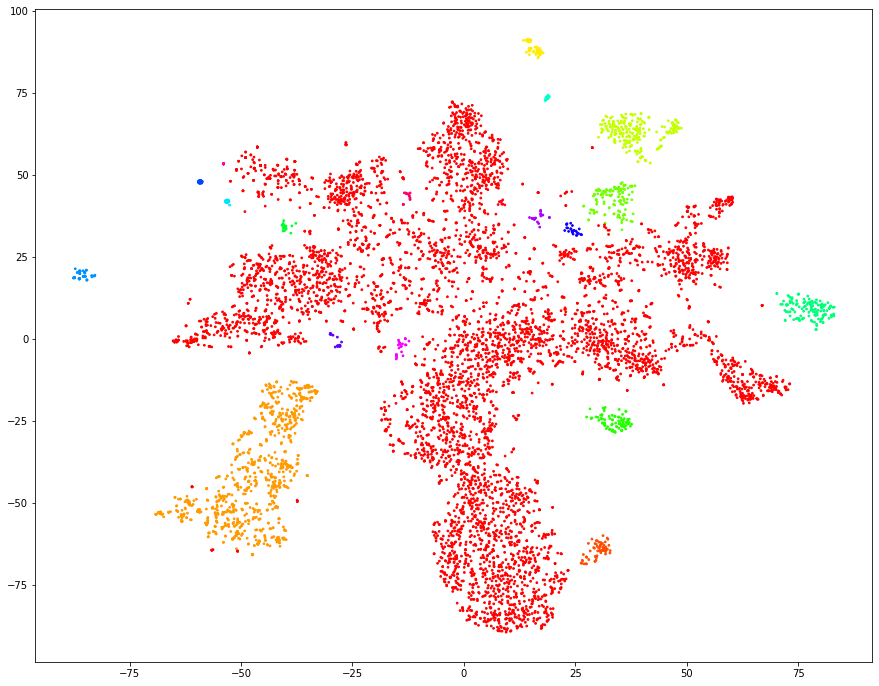

In [ ]:
plot_interactive_kep(entity_embeddings, cluster = True)

## KE Bigbird

It's possible that the descriptions could be longer than 512 tokens, let's verify this

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("roberta-base")

over = 0
for descr in entity_to_text.values():
  if len(tokenizer.encode(descr)) > 512:
    over += 1
print(f"Out of {len(entity_to_text)} descriptions {over} are more than 512 tokens long")

Token indices sequence length is longer than the specified maximum sequence length for this model (13138 > 512). Running this sequence through the model will result in indexing errors


Out of 7631 descriptions 4468 are more than 512 tokens long


More than half of the descriptions do not fit into Roberta's context length, using an efficient transformer makes sense.

Apparently the efficient transformers we have seen in class (performer, reformer, bigbird) do not have publicly available weights finetuned on wikipedia-like datasets, thus I'm taking the base "google/bigbird-roberta-base" model which at least is pretrained on wikipedia.  
Also apparently efficient transformers are not that efficient, there is no smaller bigbird model and the base model in colab allows me to only train with batch size equal to 1 and max context size 768.


In [ ]:
# Use bigbird
model_name = "google/bigbird-roberta-base"

# Instatiate the tokenizer
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained(model_name)

# Create KE dataset
KE_tokenized, relation_mapper = create_KE_dataset(wd_50_train, entities, entity_to_text, max_length=768)

# Restrict to 10k samples, sigh
KE_tokenized = KE_tokenized.select(random.sample(list(range(12000)), 10000))

  0%|          | 0/12000 [00:00<?, ?ex/s]

In [ ]:
trained_model = train_model(model_name, n_epochs=1, margin=4, batch_size=1, train_KE=KE_tokenized, joint_mlm=False, model_family="bigbird")

# Save model
torch.save(trained_model, "bigbird_KE.pkl")

Downloading:   0%|          | 0.00/513M [00:00<?, ?B/s]

Some weights of the model checkpoint at google/bigbird-roberta-base were not used when initializing BigBirdForMaskedLM: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BigBirdForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BigBirdForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Epoch: 1
0/10000 - Loss: 23.56
500/10000 - Loss: 23.51
1000/10000 - Loss: 23.44
1500/10000 - Loss: 23.32
2000/10000 - Loss: 23.22
2500/10000 - Loss: 23.11
3000/10000 - Loss: 23.00
3500/10000 - Loss: 22.92
4000/10000 - Loss: 22.83
4500/10000 - Loss: 22.75
5000/10000 - Loss: 22.66
5500/10000 - Loss: 22.58
6000/10000 - Loss: 22.52
6500/10000 - Loss: 22.45
7000/10000 - Loss: 22.39
7500/10000 - Loss: 22.33
8000/10000 - Loss: 22.28
8500/10000 - Loss: 22.23
9000/10000 - Loss: 22.18
9500/10000 - Loss: 22.14
Epoch Loss: 22.10


In [ ]:
# Load model
trained_model = torch.load("bigbird_KE.pkl")

# Evaluation
trained_model.eval()
entity_embeddings = get_entity_embeddings(trained_model, tokenizer, entities, label_name_entmap, entity_to_text)
relation_embeddings = get_relation_embeddings(trained_model, relations, relation_mapper)

print("Evaluation on test set:")
metrics = compute_metrics(trained_model, wd_50_test.triples, entity_embeddings, relation_embeddings)
print("Forward mean rank evaluation:", metrics["f_mean_rank"])
print("Backward mean rank evaluation:", metrics["b_mean_rank"])
print("Mean rank evaluation:", metrics["mean_rank"])

print("Forward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_f"])
print("Backward Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank_b"])
print("Mean-reciprocal rank evaluation:",  metrics["mean_reciprocal_rank"])

print("Forward Hits@1:",  metrics["hits_at_1_f"])
print("Backward Hits@1:",  metrics["hits_at_1_b"])
print("Hits@1:",  metrics["hits_at_1"])

print("Forward Hits@10:",  metrics["hits_at_10_f"])
print("Backward Hits@10:",  metrics["hits_at_10_b"])
print("Hits@10:",  metrics["hits_at_10"])

Attention type 'block_sparse' is not possible if sequence_length: 512 <= num global tokens: 2 * config.block_size + min. num sliding tokens: 3 * config.block_size + config.num_random_blocks * config.block_size + additional buffer: config.num_random_blocks * config.block_size = 704 with config.block_size = 64, config.num_random_blocks = 3. Changing attention type to 'original_full'...


Evaluation on test set:
Forward mean rank evaluation: 3998.779666666667
Backward mean rank evaluation: 3829.508333333333
Mean rank evaluation: 3914.144
Forward Mean-reciprocal rank evaluation: 0.0026546589480240285
Backward Mean-reciprocal rank evaluation: 0.0016437834510292806
Mean-reciprocal rank evaluation: 0.0021492211995266545
Forward Hits@1: 0.0006666666666666666
Backward Hits@1: 0.0
Hits@1: 0.0003333333333333333
Forward Hits@10: 0.0033333333333333335
Backward Hits@10: 0.0
Hits@10: 0.0016666666666666668


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


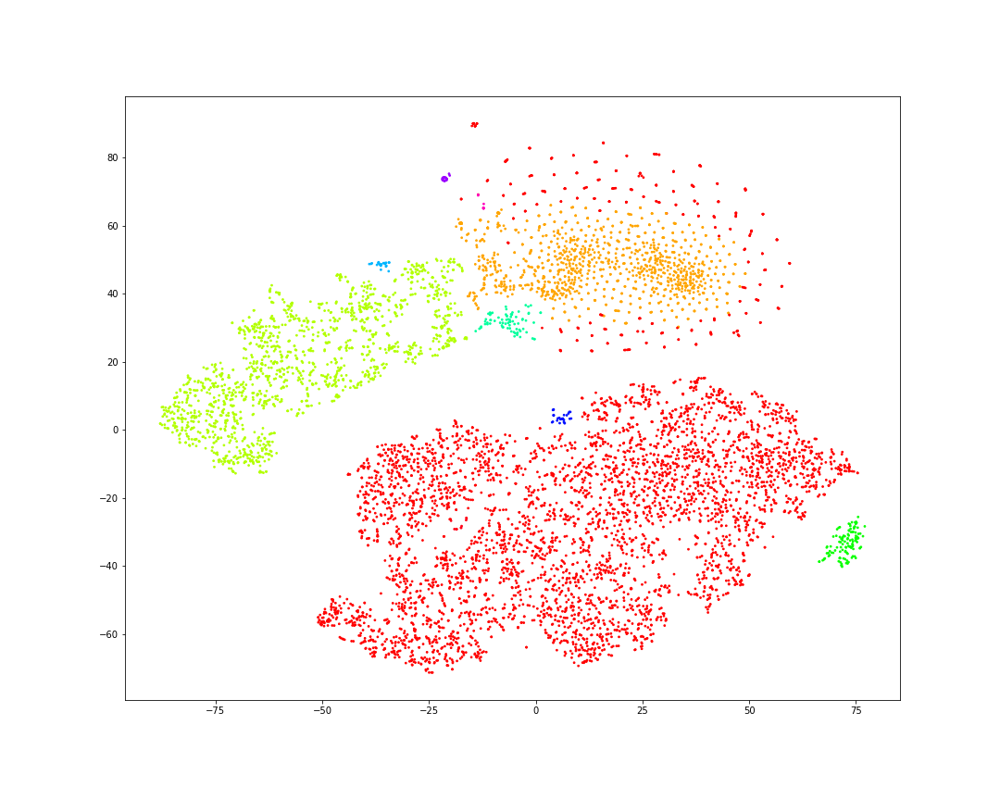

In [ ]:
plot_interactive_kep(entity_embeddings, cluster = True)

# Comparisons with the SOTA
The [paper](https://aclanthology.org/2020.emnlp-main.596.pdf) which presented the Wikidata50K dataset also published a new approach, StarE, with which the author obtains the following results, which are considered the SOTA:

| MRR   | H@1   | H@10  |
|-------|-------|-------|
| 0.349 | 0.271 | 0.496 |

One thing to notice is the fact that even this method is not strictly a triplet based one, but an hyper-relational one, which also uses the embeddings outputs of a transformer model as the starting point for the embedding.

However the link prediction task is quite an hard task to make a comparison with when the dataset is not exactly the same.  
In our case in fact the dataset has been shrinked and the number of entities is much lower than the original one, making comparisons with the SOTA extremely unreliable.

# Conclusions
In the end we can say that this method of embedding entities by using their description is quite expensive compared to the basic knowledge embedding methods, in particular when we also perform MLM joint training.  

Despite this cost the results are encouraging, even if we were only able to train in a suboptimal way, in particular we were able to beat the simplest triplet-only models like TransE, DistMult and ConvE.  
However more recent models, like BoxE and QuatE, outperform it by a reasonable margin.  
The main drawback of this model seems to be its much worse performance on backward link prediction, which is due to the TransE-like formulation of the scoring function.  

However these models induce a much better representation, which we can appreciate when plotting them and can aid us in making sense of the knowledge graph as a whole.

From previous testing it seemed like training is quite brittle, wrong hyperparameters can skew results by a lot  

In these limited tests the joint objective of KE+MLM does not seem to matter too much, this kind of makes sense since its effect should only come into effect when we are in the training dataset interpolating regime, something which we did not reach. However it seems like MLM trained models induce a better clustered structure.

We experimented both with a normal-size transformer (distilroberta) and a low-parameter count transformer (bert-tiny), it turned out that they achieve similar results in the link prediction task, with the smaller model being even slightly better than the larger one, however the smaller model is not able to obtain embeddings that are as meaningful.

We also tested an efficient transformer, which turned out to be not that efficient and only allowed us to train on an even smaller dataset with not much gains in term of context length. We weren't able to obtain any good results with it.